In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
sns.set_style('whitegrid')
sns.set_context('talk', font_scale=1.5)

output_path = '../results/simulations/figures'


Bad key "text.kerning_factor" on line 4 in
/Users/JudithAbecassis/miniconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.1.3/matplotlibrc.template
or from the matplotlib source distribution


In [2]:
res_df = pd.read_csv('../results/simulations/20211016_simulations.csv', sep='\t')
print(res_df.shape)

(128520, 15)


In [3]:
res_df = res_df.assign(total_effect_bias=(res_df.total_effect-res_df.true_total_effect)/res_df.true_total_effect,
                       direct_effect_bias=(res_df.direct_control_effect-res_df.true_direct_effect)/res_df.true_direct_effect,
                       indirect_effect_bias=(res_df.indirect_treated_effect-res_df.true_indirect_effect)/res_df.true_indirect_effect)

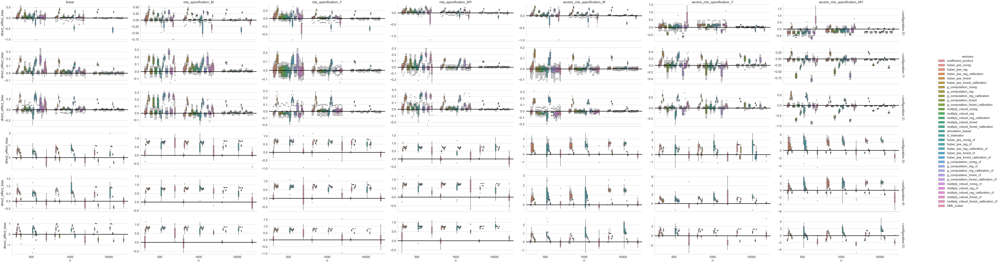

In [4]:
g = sns.catplot(x="n", y="direct_effect_bias", hue="estimator",
                col="setting", row='configuration', data=res_df[res_df.beta_t_factor==1], aspect=3,
                kind='box', sharey=False, margin_titles=True)
for i in range(g.axes.shape[0]):
    for j in range(g.axes.shape[1]):
        true_val = 0
        g.axes[i, j].axhline(y=true_val, color="black", lw=4)
        
g = g.set_titles(col_template='{col_name}', row_template='configuration {row_name}')


In [5]:
res_df.setting.value_counts().sort_index()

linear                         18360
mis_specification_M            18360
mis_specification_MY           18360
mis_specification_Y            18360
severe_mis_specification_M     18360
severe_mis_specification_MY    18360
severe_mis_specification_Y     18360
Name: setting, dtype: int64

In [6]:
nice_names_dict = \
{"DML_huber"                             : "medDML",
"G_estimator"                           : "G-estimator",
"coefficient_product"                   : "Coefficient product",
"g_computation_forest"                  : "G-computation (forest)",
"g_computation_forest_calibration"      : "G-computation (forest & calibration)",
"g_computation_forest_calibration_cf"   : "G-computation (forest & calibration & cross-fitting)",
"g_computation_forest_cf"               : "G-computation (forest & cross-fitting)",
"g_computation_noreg"                   : "G-computation (no regularization)",
"g_computation_noreg_cf"                : "G-computation (no regularization & cross-fitting)",
"g_computation_reg"                     : "G-computation (regularization)",
"g_computation_reg_calibration"         : "G-computation (regularization & calibration)",
"g_computation_reg_calibration_cf"      : "G-computation (regularization & calibration & cross-fitting)",
"g_computation_reg_cf"                  : "G-computation (regularization & cross-fitting)",
"huber_ipw_forest"                      : "IPW (forest)",
"huber_ipw_forest_calibration"          : "IPW (forest & calibration)",
"huber_ipw_forest_calibration_cf"       : "IPW (forest & calibration & cross-fitting)",
"huber_ipw_forest_cf"                   : "IPW (forest & cross-fitting)",
"huber_ipw_noreg"                       : "IPW (no regularization)",
"huber_ipw_noreg_cf"                    : "IPW (no regularization & cross-fitting)",
"huber_ipw_reg"                         : "IPW (regularization)",
"huber_ipw_reg_calibration"             : "IPW (regularization & calibration)",
"huber_ipw_reg_calibration_cf"          : "IPW (regularization & calibration & cross-fitting)",
"huber_ipw_reg_cf"                      : "IPW (regularization & cross-fitting)",
"multiply_robust_forest"                : "multiply robust (forest)",
"multiply_robust_forest_calibration"    : "multiply robust (forest & calibration)",
"multiply_robust_forest_calibration_cf" : "multiply robust (forest & calibration & cross-fitting)",
"multiply_robust_forest_cf"             : "multiply robust (forest & cross-fitting)",
"multiply_robust_noreg"                 : "multiply robust (no regularization)",
"multiply_robust_noreg_cf"              : "multiply robust (no regularization & cross-fitting)",
"multiply_robust_reg"                   : "multiply robust (regularization)",
"multiply_robust_reg_calibration"       : "multiply robust (regularization & calibration)",
"multiply_robust_reg_calibration_cf"    : "multiply robust (regularization & calibration & cross-fitting)",
"multiply_robust_reg_cf"                : "multiply robust (regularization & cross-fitting)",
"simulation_based"                      : "simulation-based estimator"}
res_df = res_df.assign(nice_estimator=res_df.estimator.map(nice_names_dict))
res_df = res_df.assign(forest=res_df.nice_estimator.str.contains('forest'))
res_df = res_df.assign(cross_fitting=res_df.nice_estimator.str.contains('cross-fitting'))
res_df = res_df.assign(regularization=res_df.nice_estimator.str.contains('\(regularization'))
res_df = res_df.assign(base_estimator=res_df.nice_estimator.str.split(' \(').str.get(0))

nice_names_settings = \
{"linear"                       : "linear",
"mis_specification_M"          : "misspecification M",
"mis_specification_MY"         : "misspecification M & Y",
"mis_specification_Y"          : "misspecification Y",
"severe_mis_specification_M"   : "severe misspecification M",
"severe_mis_specification_MY"  : "severe misspecification M & Y",
"severe_mis_specification_Y"   : "severe misspecification Y"}

res_df = res_df.assign(nice_setting=res_df.setting.map(nice_names_settings))

config_dict = {0: '1D X - 1D M (binary)',
               1: '5D X - 1D M (binary)',
               2: '20D X - 1D M (binary)',
               3: '5D X - 5D M (continuous)',
               4: '20D X - 5D M (continuous)',
               5: '20D X - 20D M (continuous)'}

res_df = res_df.assign(mediated_proportion=res_df.beta_t_factor.map({0.1: 'low', 1: 'medium', 5: 'high'}))


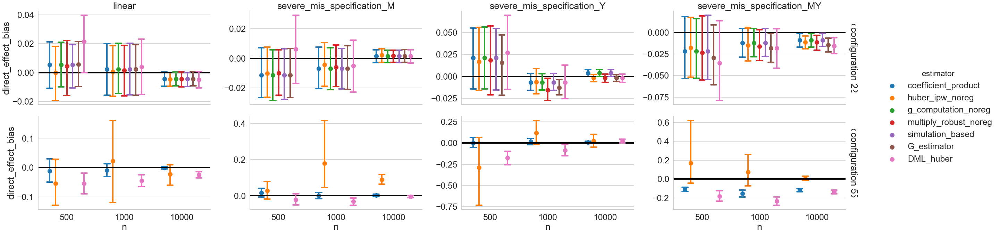

In [7]:
general_estimators = ['coefficient_product',
                      'g_computation_noreg',
                      'simulation_based',
                      'huber_ipw_noreg',
                      'multiply_robust_noreg',
                      'DML_huber',
                      'G_estimator']
g = sns.catplot(x="n", y="direct_effect_bias", hue="estimator",
                col="setting", row='configuration', data=res_df[(res_df.beta_t_factor==0.1)&(res_df.estimator.isin(general_estimators))&(res_df.configuration.isin([2, 5])) &
                      ((res_df.setting=='linear')|(res_df.setting.str.contains('severe')))], aspect=1.8,
                kind='point', sharey=False, margin_titles=True, dodge=0.6, capsize=0.1, join=False)
for i in range(g.axes.shape[0]):
    for j in range(g.axes.shape[1]):
        true_val = 0
        g.axes[i, j].axhline(y=true_val, color="black", lw=4)
        
g = g.set_titles(col_template='{col_name}', row_template='configuration {row_name}')


In [8]:
res_df = res_df.assign(num_mediated_prob=res_df.true_indirect_effect/res_df.true_total_effect)
res_df.groupby(['mediated_proportion', 'setting', 'configuration']).agg({'num_mediated_prob':['min', 'max', 'mean', 'nunique']})

num_mediated_prob  \
                                                                           min   
mediated_proportion setting                    configuration                     
high                linear                     0                      0.286515   
                                               1                      0.290866   
                                               2                      0.290967   
                                               3                      0.789474   
                                               4                      0.789474   
...                                                                        ...   
medium              severe_mis_specification_Y 1                      0.235706   
                                               2                      0.233418   
                                               3                      0.428571   
                                               4                      0.428571   
                                               5                      0.428571   

                                                                        \
                                                                   max   
mediated_proportion setting                    configuration             
high                linear                     0              0.301625   
                                               1              0.297385   
                                               2              0.296578   
                                               3              0.789474   
                                               4              0.789474   
...                                                                ...   
medium              severe_mis_specification_Y 1              0.239430   
                                               2              0.238822   
                                               3              0.428571   
                                               4              0.428571   
                                               5              0.428571   

                                                                                
                                                                  mean nunique  
mediated_proportion setting                    configuration                    
high                linear                     0              0.294470      30  
                                               1              0.293996      30  
                                               2              0.293871      30  
                                               3              0.789474       1  
                                               4              0.789474       1  
...                                                                ...     ...  
medium              severe_mis_specification_Y 1              0.237224      30  
                                               2              0.236885      30  
                                               3              0.428571       1  
                                               4              0.428571       1  
                                               5              0.428571       1  

[126 rows x 4 columns]

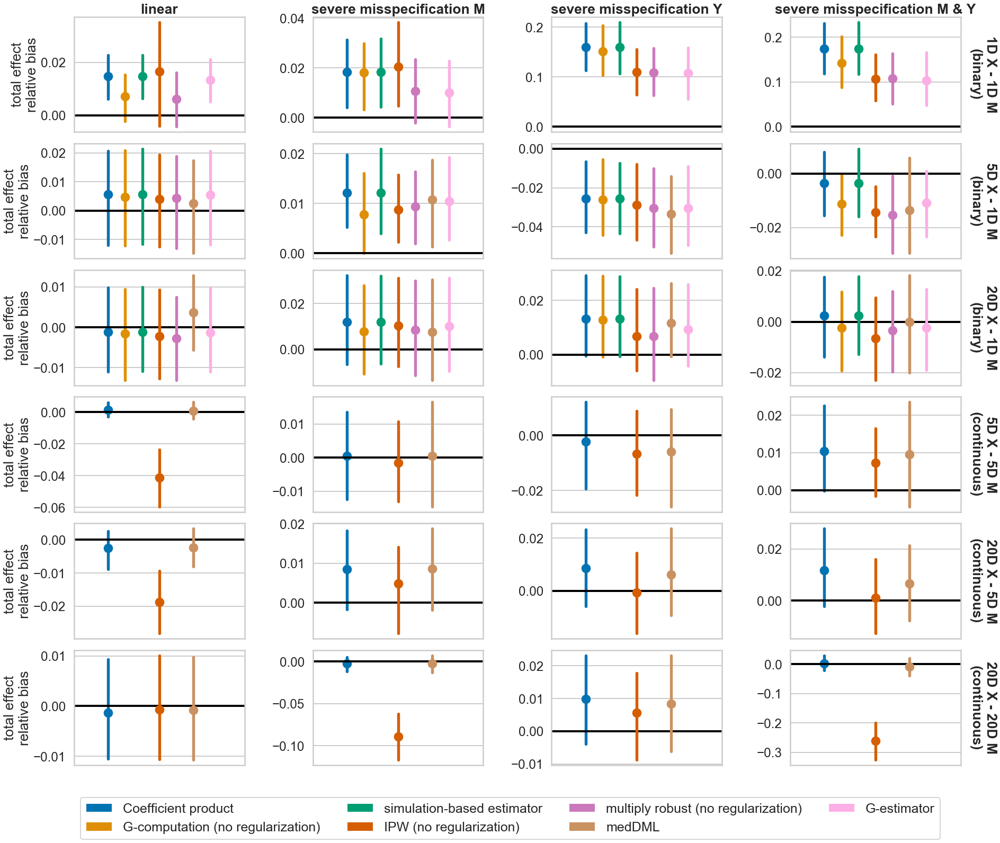

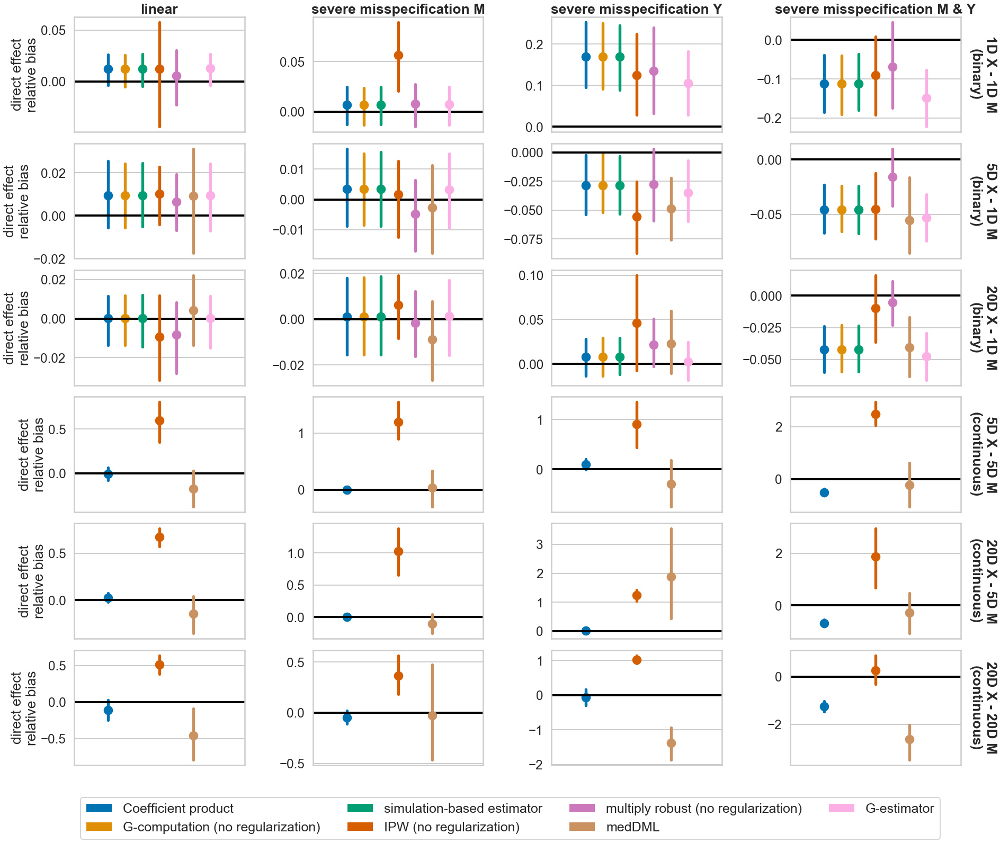

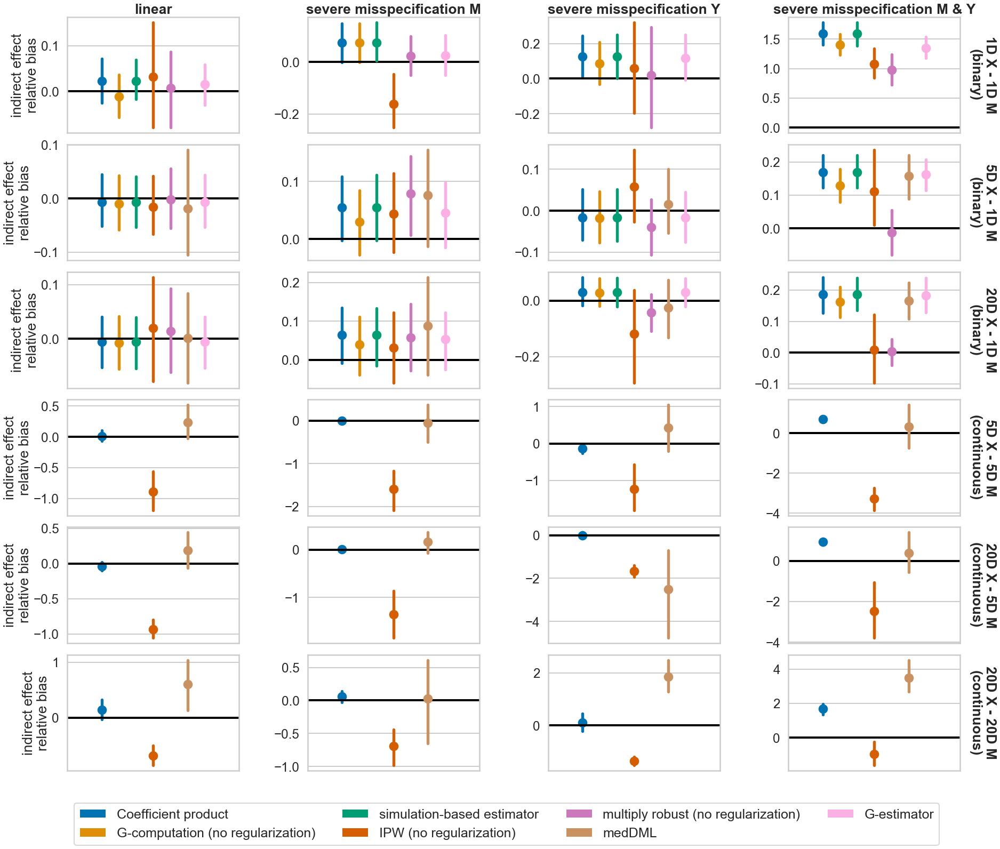

In [9]:
sns.set_context('poster', font_scale=1.1)
for effect in ('total', 'direct', 'indirect'):
    f, axes = plt.subplots(nrows=6, ncols=4, figsize=(30, 26))

    general_estimators = ['coefficient_product',
                          'g_computation_noreg',
                          'simulation_based',
                          'huber_ipw_noreg',
                          'multiply_robust_noreg',
                          'DML_huber',
                          'G_estimator']

    restr_df = res_df[(res_df.beta_t_factor==1)&
                      (res_df.estimator.isin(general_estimators))&
                      ((res_df.setting=='linear')|(res_df.setting.str.contains('severe'))) &
                      (res_df.n==1000)]

    color_list = sns.color_palette("colorblind").as_hex()
    for ii, configuration in enumerate([0, 1, 2, 3, 4, 5]):
        for jj, setting in enumerate(["linear", "severe misspecification M", "severe misspecification Y", "severe misspecification M & Y"]):
            sub_df = restr_df[(restr_df.configuration==configuration)&(restr_df.nice_setting==setting)]
            ax = axes[ii, jj]
            sns.pointplot(x="n", y="{}_effect_bias".format(effect), hue="estimator",
                          hue_order=general_estimators,
                            data=sub_df,
                           palette="colorblind",
                             jitter=True, ax=ax, size=10, join=False, dodge=0.6)
            if (ii==5) and (jj==0):
                legend_items = list()
                for idx, key in enumerate(general_estimators):
                    legend_items.append(Patch(facecolor=color_list[idx], edgecolor='white', label=nice_names_dict[key]))
                ax.legend(handles=legend_items,
                          bbox_to_anchor=(-0, -0.7, 1., .102), fontsize=25, loc=3, ncol=4)
            else:
                ax.get_legend().remove()
            if jj!=0:
                ax.set_ylabel('')
                #ax.yaxis.set_ticklabels([])
            else:
                ax.set_ylabel('{} effect\nrelative bias'.format(effect))
            ax.set_xlabel('')
            ax.xaxis.set_ticklabels([])

            if ii==0:
                ax.set_title(setting, fontweight="bold")
            if jj==3:
                ax.text(1.05,0.5,config_dict[configuration].replace(' (', '\n('), fontweight="bold",
                               verticalalignment='center', rotation=270,transform=ax.transAxes, ma='center')


            ax.axhline(y=0, color="black", lw=4)
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.4, hspace=0.1)
    plt.savefig('{}/{}_effect_general_trend.pdf'.format(output_path, effect), bbox_inches='tight')

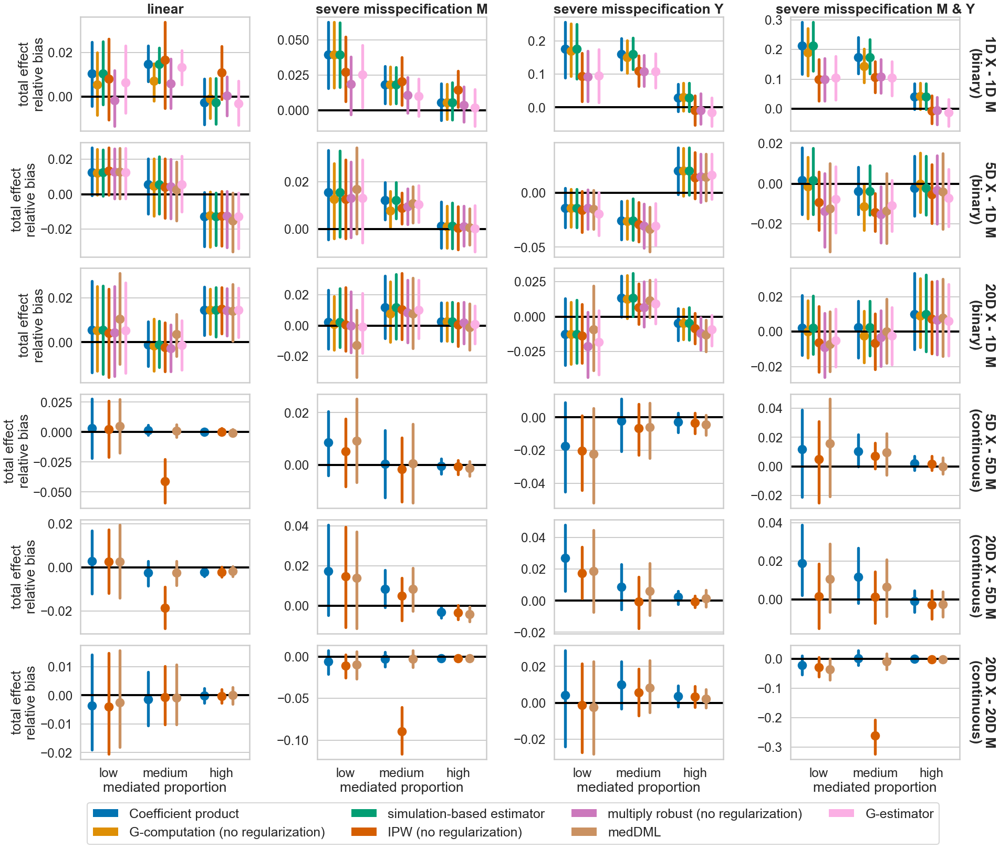

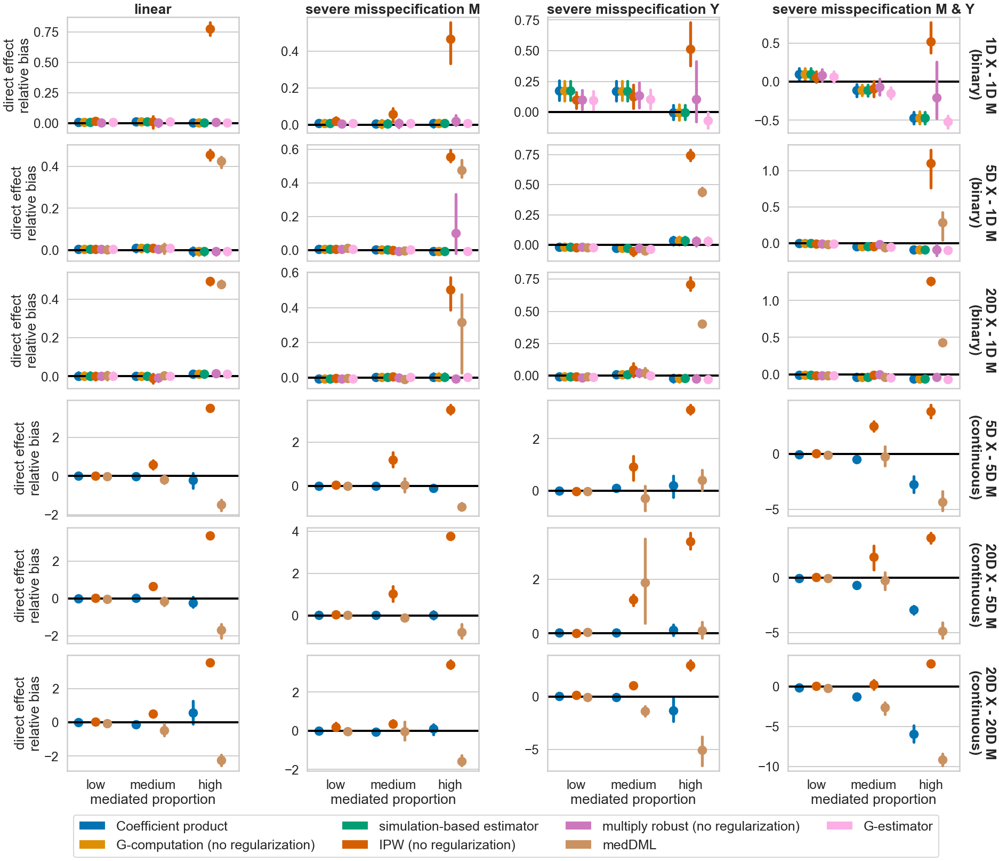

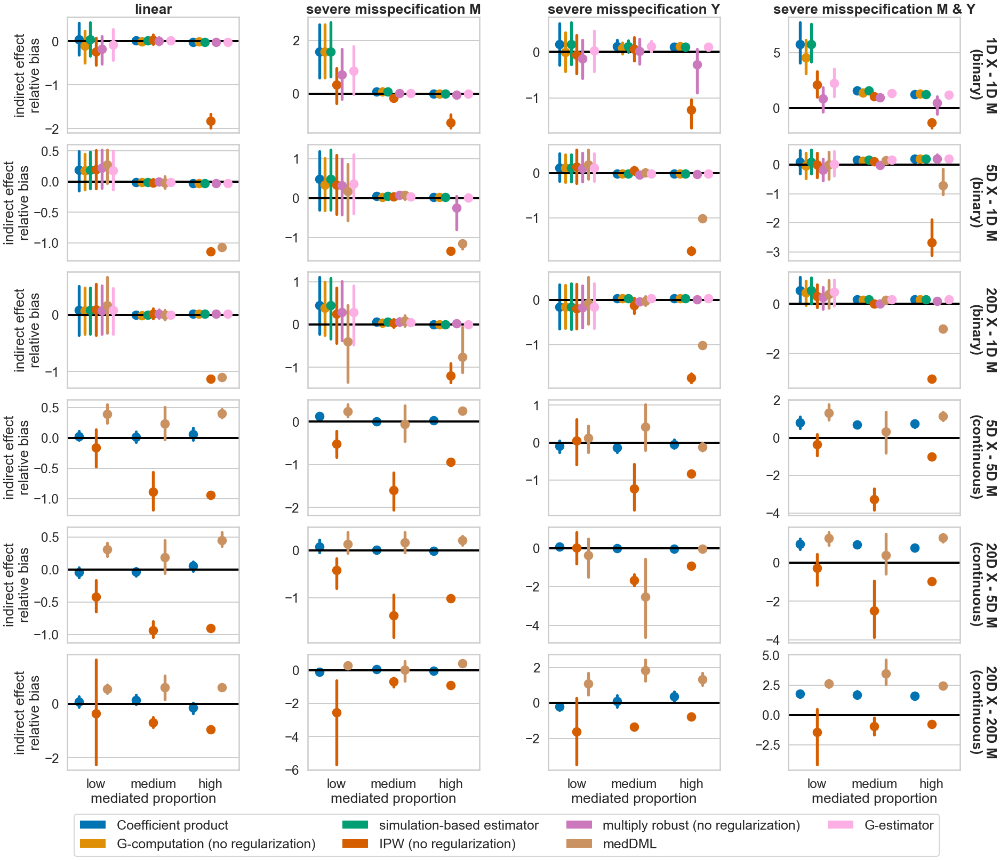

In [10]:
sns.set_context('poster', font_scale=1.1)
for effect in ('total', 'direct', 'indirect'):
    f, axes = plt.subplots(nrows=6, ncols=4, figsize=(30, 26))

    general_estimators = ['coefficient_product',
                          'g_computation_noreg',
                          'simulation_based',
                          'huber_ipw_noreg',
                          'multiply_robust_noreg',
                          'DML_huber',
                          'G_estimator']

    restr_df = res_df[(res_df.estimator.isin(general_estimators))&
                      ((res_df.setting=='linear')|(res_df.setting.str.contains('severe'))) &
                      (res_df.n==1000)]

    color_list = sns.color_palette("colorblind").as_hex()
    for ii, configuration in enumerate([0, 1, 2, 3, 4, 5]):
        for jj, setting in enumerate(["linear", "severe misspecification M", "severe misspecification Y", "severe misspecification M & Y"]):
            sub_df = restr_df[(restr_df.configuration==configuration)&(restr_df.nice_setting==setting)]
            ax = axes[ii, jj]
            sns.pointplot(x="mediated_proportion", y="{}_effect_bias".format(effect), hue="estimator",
                          hue_order=general_estimators,
                            data=sub_df,
                           palette="colorblind",
                             jitter=True, ax=ax, size=10, join=False, dodge=0.6)
            if (ii==5) and (jj==0):
                legend_items = list()
                for idx, key in enumerate(general_estimators):
                    legend_items.append(Patch(facecolor=color_list[idx], edgecolor='white', label=nice_names_dict[key]))
                ax.legend(handles=legend_items,
                          bbox_to_anchor=(-0, -0.8, 1., .102), fontsize=25, loc=3, ncol=4)
            else:
                ax.get_legend().remove()
            if jj!=0:
                ax.set_ylabel('')
                #ax.yaxis.set_ticklabels([])
            else:
                ax.set_ylabel('{} effect\nrelative bias'.format(effect))
            if ii!=5:
                ax.set_xlabel('')
                ax.xaxis.set_ticklabels([])
            else:
                ax.set_xlabel('mediated proportion')

            if ii==0:
                ax.set_title(setting, fontweight="bold")
            if jj==3:
                ax.text(1.05,0.5,config_dict[configuration].replace(' (', '\n('), fontweight="bold",
                               verticalalignment='center', rotation=270,transform=ax.transAxes, ma='center')


            ax.axhline(y=0, color="black", lw=4)
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.4, hspace=0.1)
    plt.savefig('{}/{}_effect_beta_t_factor_impact.pdf'.format(output_path, effect), bbox_inches='tight')

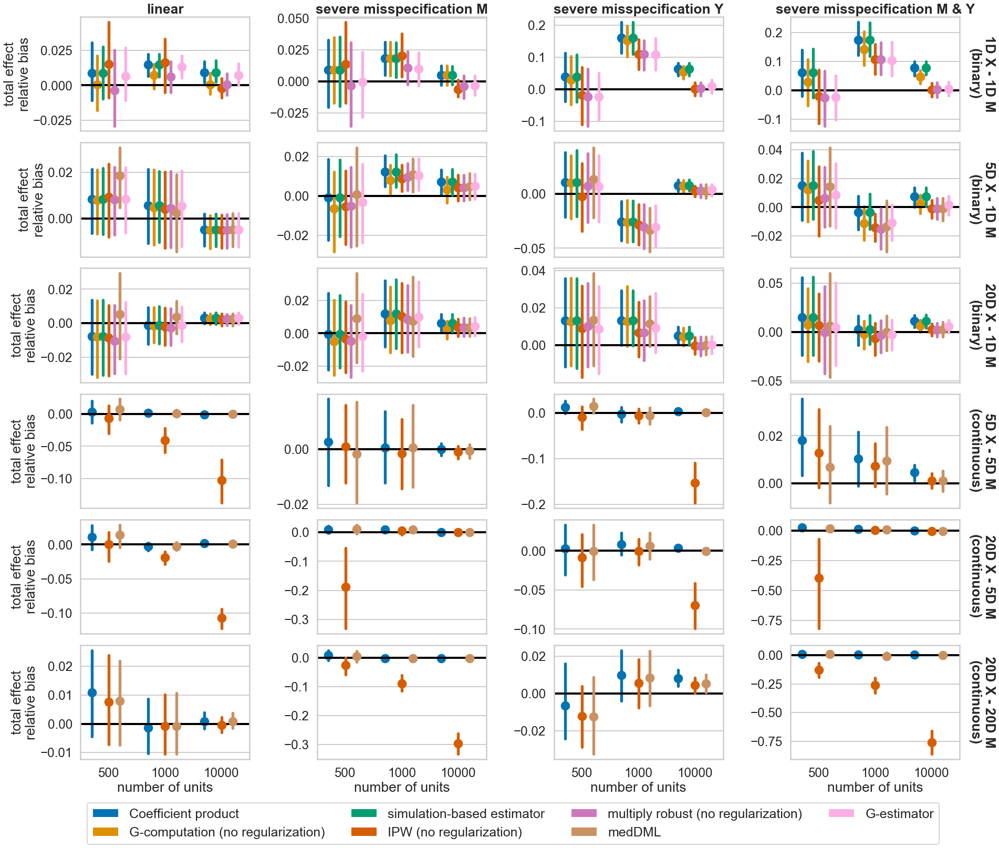

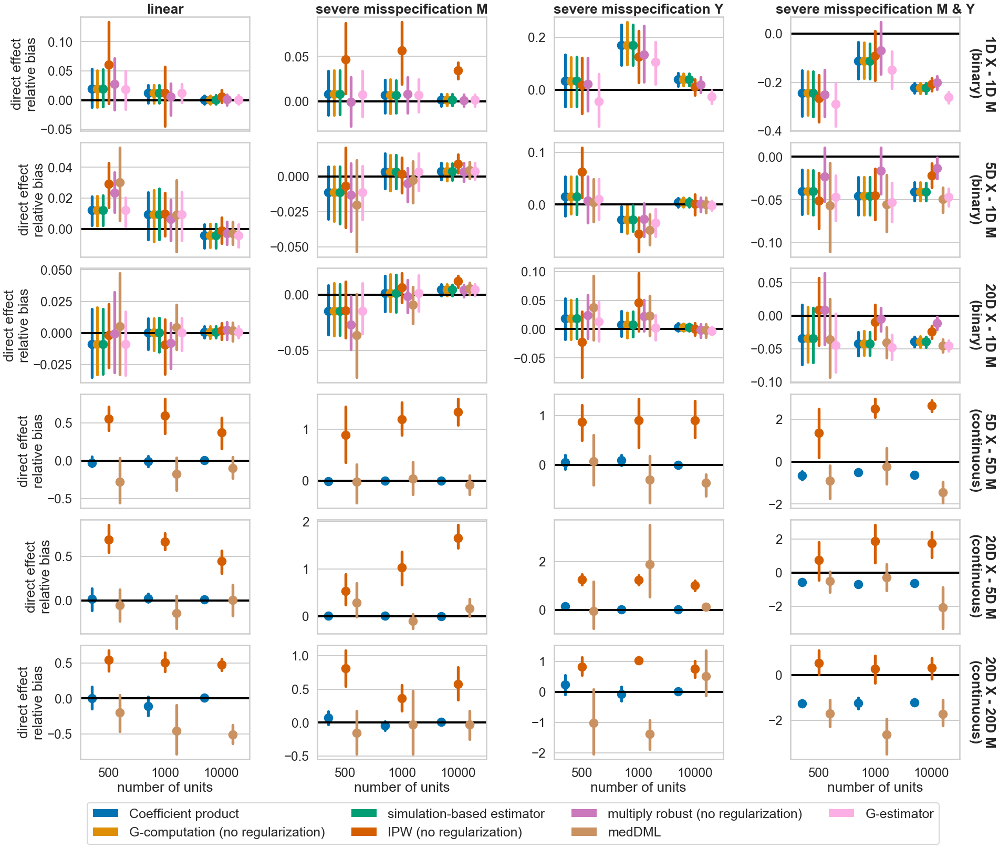

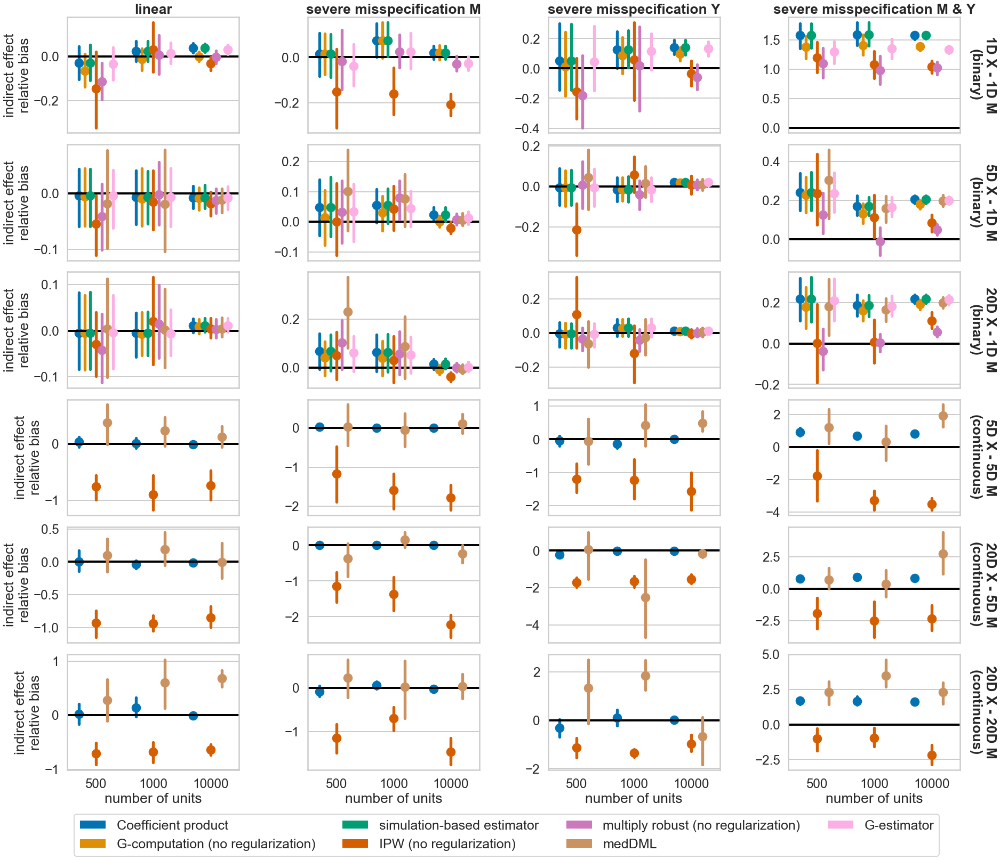

In [11]:
sns.set_context('poster', font_scale=1.1)
for effect in ('total', 'direct', 'indirect'):
    f, axes = plt.subplots(nrows=6, ncols=4, figsize=(30, 26))

    general_estimators = ['coefficient_product',
                          'g_computation_noreg',
                          'simulation_based',
                          'huber_ipw_noreg',
                          'multiply_robust_noreg',
                          'DML_huber',
                          'G_estimator']

    restr_df = res_df[(res_df.beta_t_factor==1)&
                      (res_df.estimator.isin(general_estimators))]

    color_list = sns.color_palette("colorblind").as_hex()
    for ii, configuration in enumerate([0, 1, 2, 3, 4, 5]):
        for jj, setting in enumerate(["linear", "severe misspecification M", "severe misspecification Y", "severe misspecification M & Y"]):
            sub_df = restr_df[(restr_df.configuration==configuration)&(restr_df.nice_setting==setting)]
            ax = axes[ii, jj]
            sns.pointplot(x="n", y="{}_effect_bias".format(effect), hue="estimator",
                          hue_order=general_estimators,
                            data=sub_df,
                           palette="colorblind",
                             jitter=True, ax=ax, size=10, join=False, dodge=0.6)
            if (ii==5) and (jj==0):
                legend_items = list()
                for idx, key in enumerate(general_estimators):
                    legend_items.append(Patch(facecolor=color_list[idx], edgecolor='white', label=nice_names_dict[key]))
                ax.legend(handles=legend_items,
                          bbox_to_anchor=(-0, -0.8, 1., .102), fontsize=25, loc=3, ncol=4)
            else:
                ax.get_legend().remove()
            if jj!=0:
                ax.set_ylabel('')
                #ax.yaxis.set_ticklabels([])
            else:
                ax.set_ylabel('{} effect\nrelative bias'.format(effect))
            if ii!=5:
                ax.set_xlabel('')
                ax.xaxis.set_ticklabels([])
            else:
                ax.set_xlabel('number of units')

            if ii==0:
                ax.set_title(setting, fontweight="bold")
            if jj==3:
                ax.text(1.05,0.5,config_dict[configuration].replace(' (', '\n('), fontweight="bold",
                               verticalalignment='center', rotation=270,transform=ax.transAxes, ma='center')


            ax.axhline(y=0, color="black", lw=4)
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.4, hspace=0.1)
    plt.savefig('{}/{}_effect_number_observation_impact.pdf'.format(output_path, effect), bbox_inches='tight')

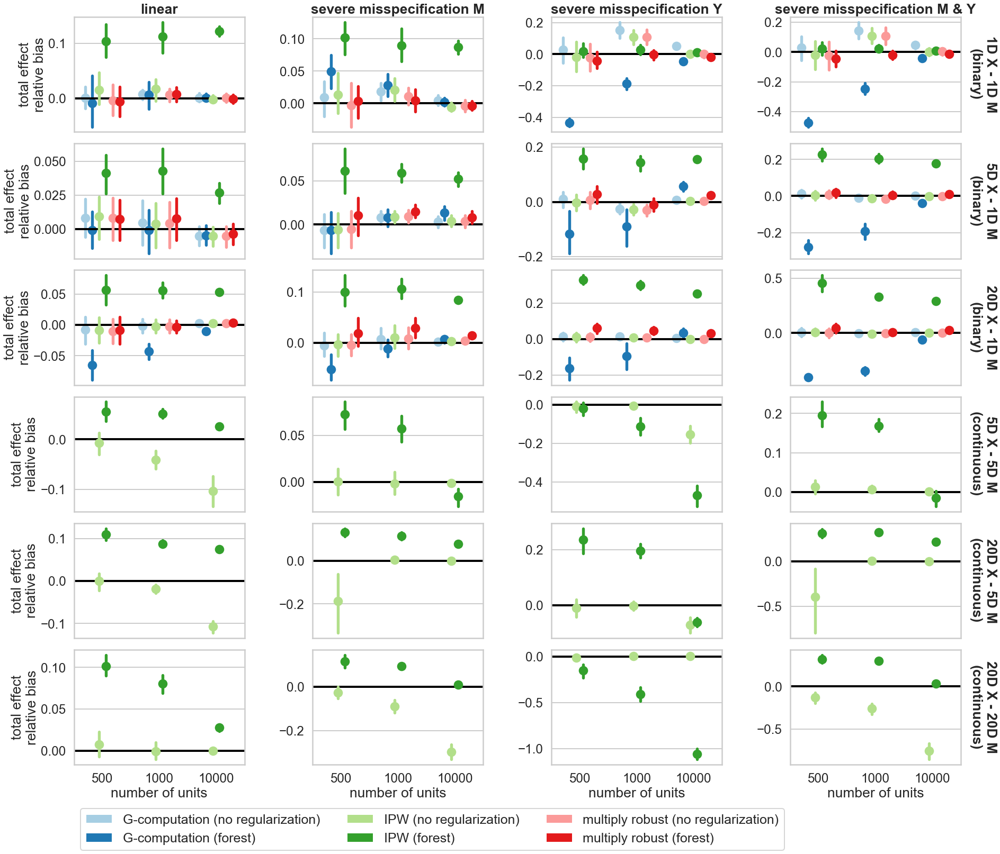

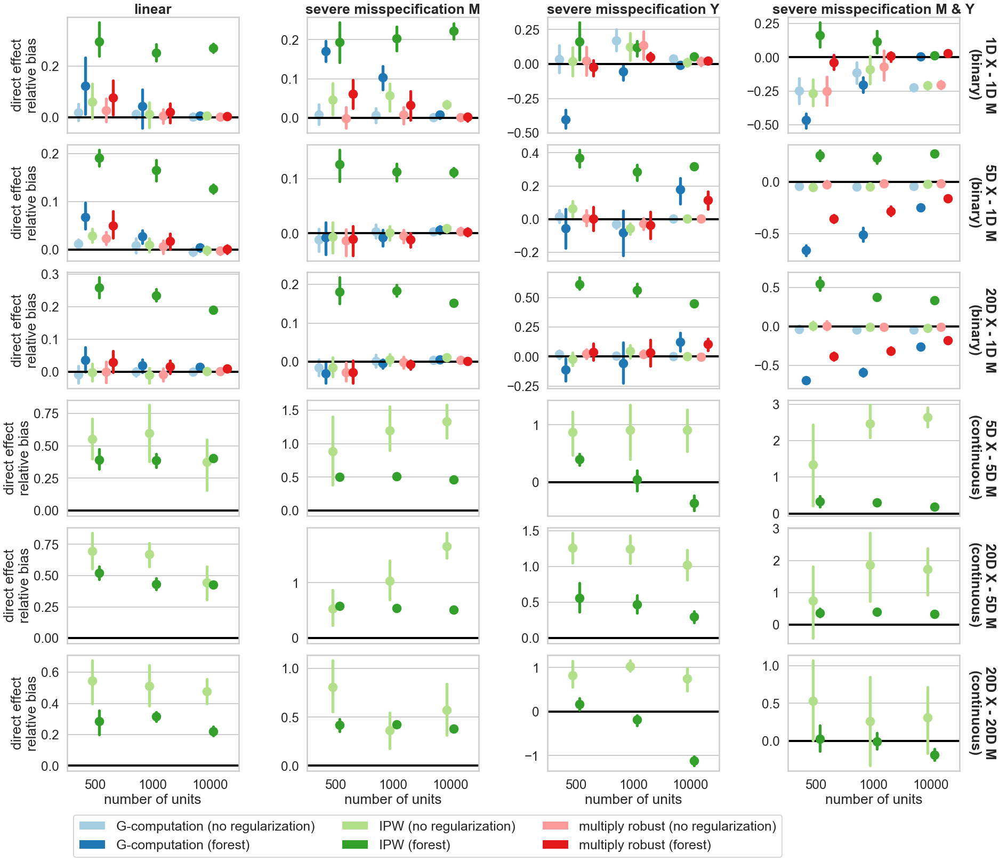

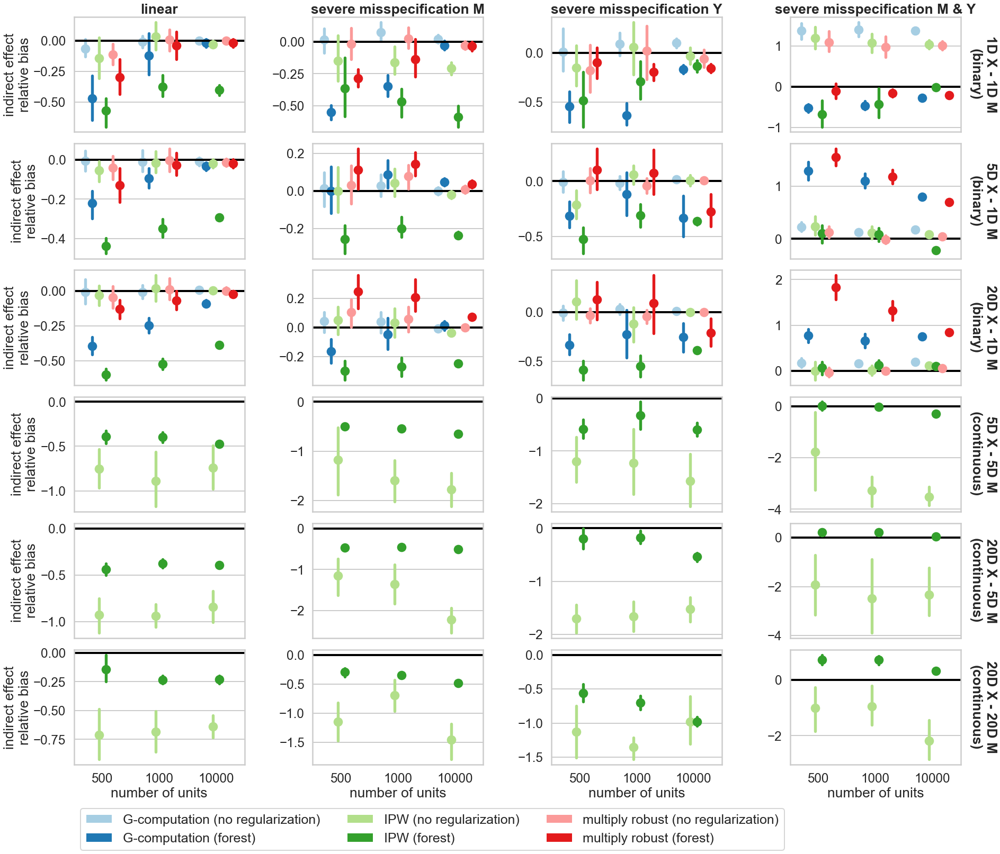

In [12]:
sns.set_context('poster', font_scale=1.1)
for effect in ('total', 'direct', 'indirect'):
    f, axes = plt.subplots(nrows=6, ncols=4, figsize=(30, 26))

    general_estimators = ['g_computation_noreg',
                          'g_computation_forest',
                          'huber_ipw_noreg',
                          'huber_ipw_forest',
                          'multiply_robust_noreg',
                          'multiply_robust_forest']

    restr_df = res_df[(res_df.beta_t_factor==1)&
                      (res_df.estimator.isin(general_estimators))&
                      ((res_df.setting=='linear')|(res_df.setting.str.contains('severe')))]

    color_list = sns.color_palette("Paired").as_hex()
    for ii, configuration in enumerate([0, 1, 2, 3, 4, 5]):
        for jj, setting in enumerate(["linear", "severe misspecification M", "severe misspecification Y", "severe misspecification M & Y"]):
            sub_df = restr_df[(restr_df.configuration==configuration)&(restr_df.nice_setting==setting)]
            ax = axes[ii, jj]
            sns.pointplot(x="n", y="{}_effect_bias".format(effect), hue="estimator",
                          hue_order=general_estimators,
                            data=sub_df,
                           palette="Paired",
                             jitter=True, ax=ax, size=10, join=False, dodge=0.6)
            if (ii==5) and (jj==0):
                legend_items = list()
                for idx, key in enumerate(general_estimators):
                    legend_items.append(Patch(facecolor=color_list[idx], edgecolor='white', label=nice_names_dict[key]))
                ax.legend(handles=legend_items,
                          bbox_to_anchor=(-0, -0.8, 1., .102), fontsize=25, loc=3, ncol=3)
            else:
                ax.get_legend().remove()
            if jj!=0:
                ax.set_ylabel('')
                #ax.yaxis.set_ticklabels([])
            else:
                ax.set_ylabel('{} effect\nrelative bias'.format(effect))
            if ii!=5:
                ax.set_xlabel('')
                ax.xaxis.set_ticklabels([])
            else:
                ax.set_xlabel('number of units')

            if ii==0:
                ax.set_title(setting, fontweight="bold")
            if jj==3:
                ax.text(1.05,0.5,config_dict[configuration].replace(' (', '\n('), fontweight="bold",
                               verticalalignment='center', rotation=270,transform=ax.transAxes, ma='center')


            ax.axhline(y=0, color="black", lw=4)
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.4, hspace=0.1)
    plt.savefig('{}/{}_effect_forest_impact.pdf'.format(output_path, effect), bbox_inches='tight')

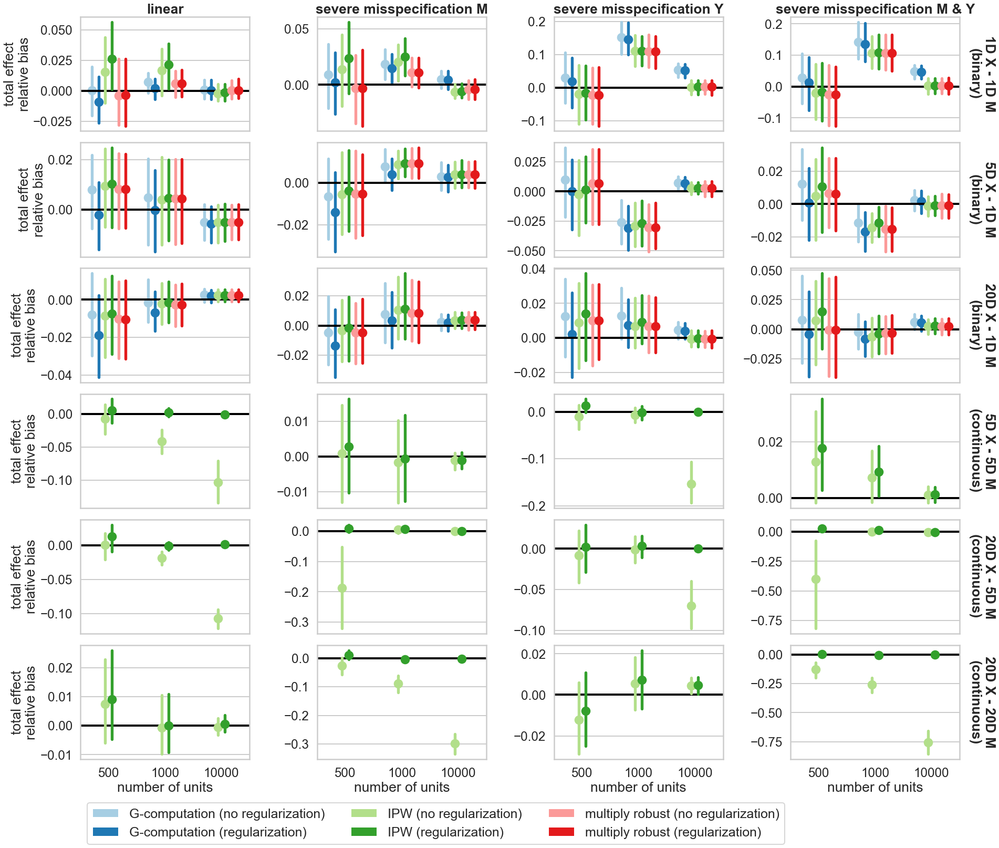

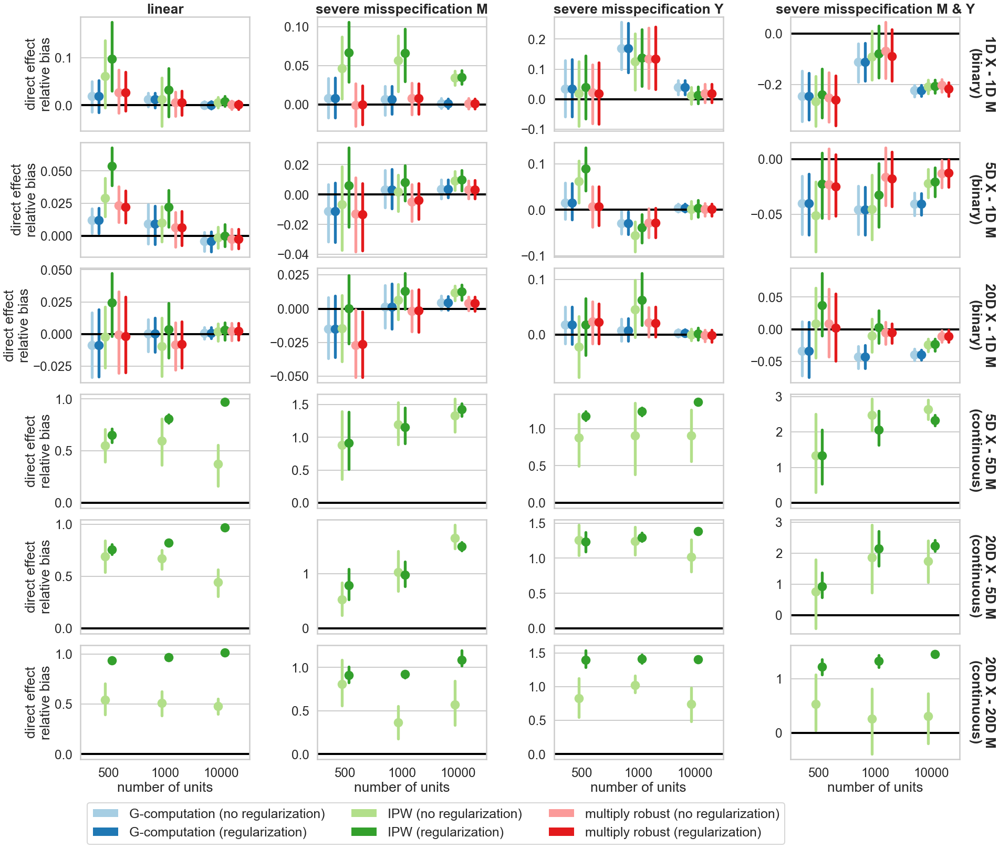

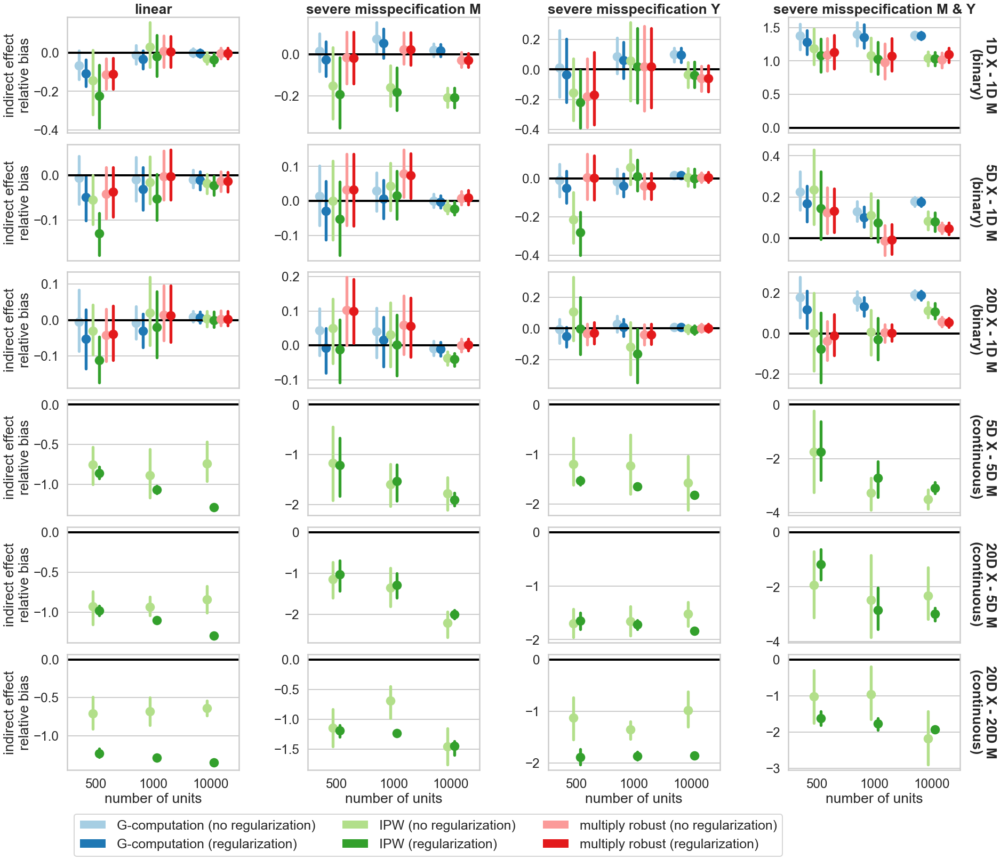

In [13]:
sns.set_context('poster', font_scale=1.1)
for effect in ('total', 'direct', 'indirect'):
    f, axes = plt.subplots(nrows=6, ncols=4, figsize=(30, 26))

    general_estimators = ['g_computation_noreg',
                          'g_computation_reg',
                          'huber_ipw_noreg',
                          'huber_ipw_reg',
                          'multiply_robust_noreg',
                          'multiply_robust_reg']

    restr_df = res_df[(res_df.beta_t_factor==1)&
                      (res_df.estimator.isin(general_estimators))&
                      ((res_df.setting=='linear')|(res_df.setting.str.contains('severe')))]

    color_list = sns.color_palette("Paired").as_hex()
    for ii, configuration in enumerate([0, 1, 2, 3, 4, 5]):
        for jj, setting in enumerate(["linear", "severe misspecification M", "severe misspecification Y", "severe misspecification M & Y"]):
            sub_df = restr_df[(restr_df.configuration==configuration)&(restr_df.nice_setting==setting)]
            ax = axes[ii, jj]
            sns.pointplot(x="n", y="{}_effect_bias".format(effect), hue="estimator",
                          hue_order=general_estimators,
                            data=sub_df,
                           palette="Paired",
                             jitter=True, ax=ax, size=10, join=False, dodge=0.6)
            if (ii==5) and (jj==0):
                legend_items = list()
                for idx, key in enumerate(general_estimators):
                    legend_items.append(Patch(facecolor=color_list[idx], edgecolor='white', label=nice_names_dict[key]))
                ax.legend(handles=legend_items,
                          bbox_to_anchor=(-0, -0.8, 1., .102), fontsize=25, loc=3, ncol=3)
            else:
                ax.get_legend().remove()
            if jj!=0:
                ax.set_ylabel('')
                #ax.yaxis.set_ticklabels([])
            else:
                ax.set_ylabel('{} effect\nrelative bias'.format(effect))
            if ii!=5:
                ax.set_xlabel('')
                ax.xaxis.set_ticklabels([])
            else:
                ax.set_xlabel('number of units')

            if ii==0:
                ax.set_title(setting, fontweight="bold")
            if jj==3:
                ax.text(1.05,0.5,config_dict[configuration].replace(' (', '\n('), fontweight="bold",
                               verticalalignment='center', rotation=270,transform=ax.transAxes, ma='center')


            ax.axhline(y=0, color="black", lw=4)
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.4, hspace=0.1)
    plt.savefig('{}/{}_effect_regularization_impact.pdf'.format(output_path, effect), bbox_inches='tight')

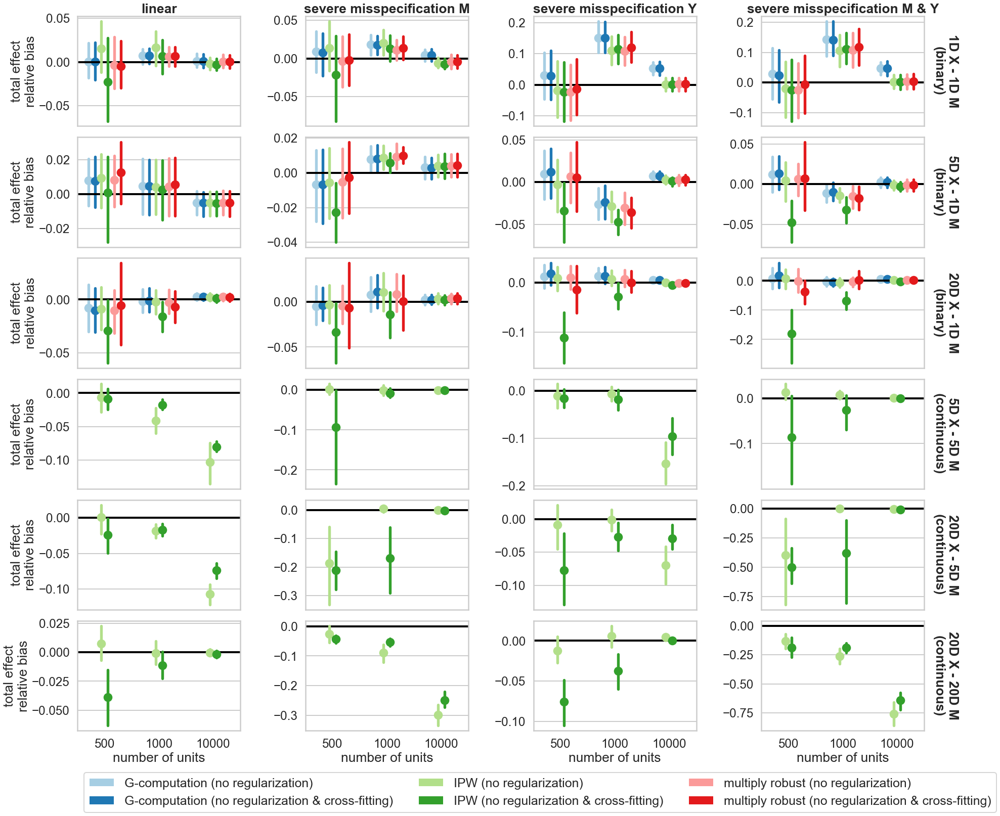

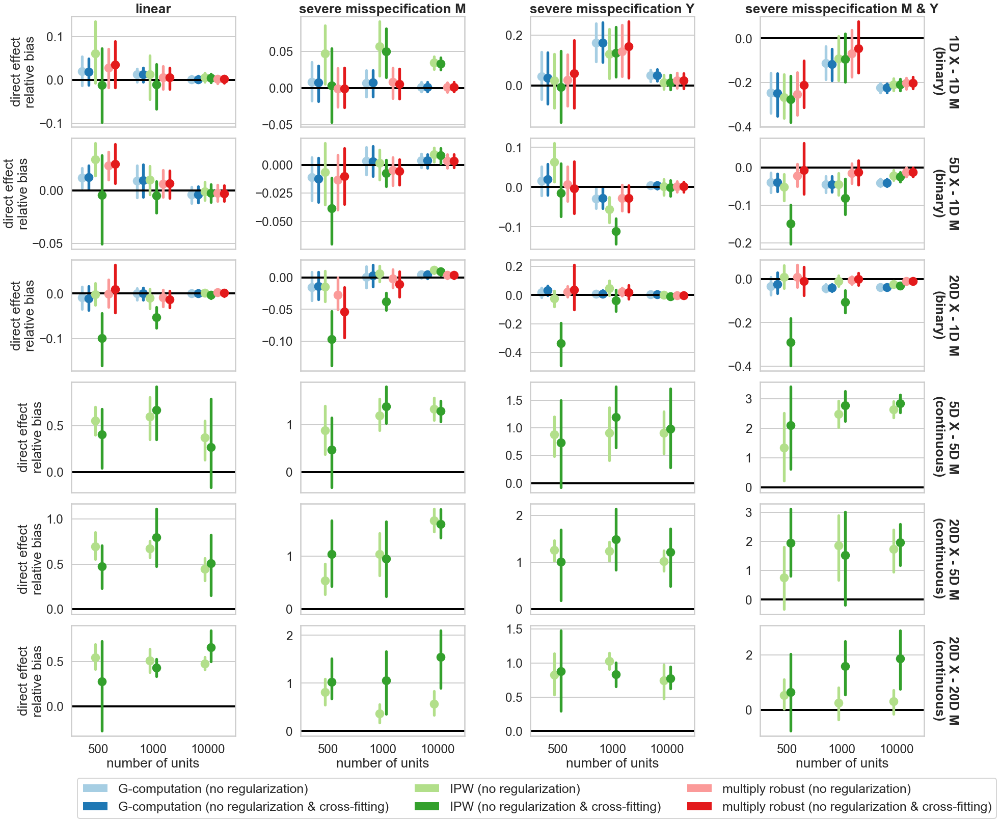

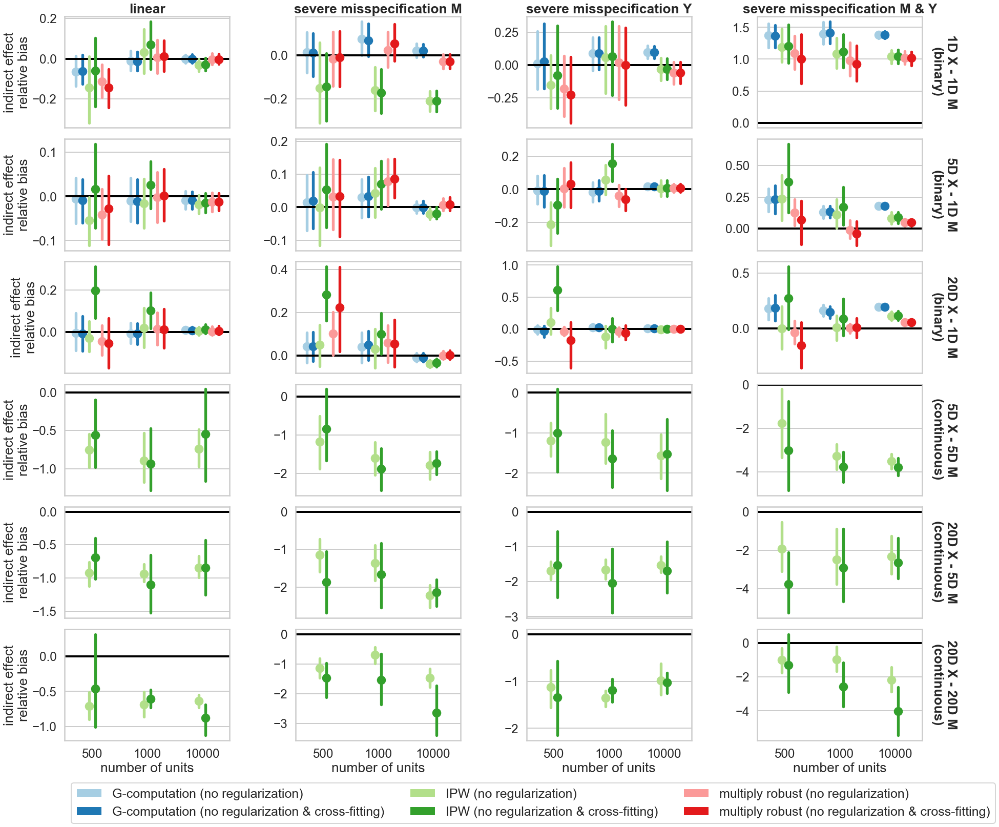

In [14]:
sns.set_context('poster', font_scale=1.1)
for effect in ('total', 'direct', 'indirect'):
    f, axes = plt.subplots(nrows=6, ncols=4, figsize=(30, 26))

    general_estimators = ['g_computation_noreg',
                          'g_computation_noreg_cf',
                          'huber_ipw_noreg',
                          'huber_ipw_noreg_cf',
                          'multiply_robust_noreg',
                          'multiply_robust_noreg_cf']

    restr_df = res_df[(res_df.beta_t_factor==1)&
                      (res_df.estimator.isin(general_estimators))&
                      ((res_df.setting=='linear')|(res_df.setting.str.contains('severe')))]

    color_list = sns.color_palette("Paired").as_hex()
    for ii, configuration in enumerate([0, 1, 2, 3, 4, 5]):
        for jj, setting in enumerate(["linear", "severe misspecification M", "severe misspecification Y", "severe misspecification M & Y"]):
            sub_df = restr_df[(restr_df.configuration==configuration)&(restr_df.nice_setting==setting)]
            ax = axes[ii, jj]
            sns.pointplot(x="n", y="{}_effect_bias".format(effect), hue="estimator",
                          hue_order=general_estimators,
                            data=sub_df,
                           palette="Paired",
                             jitter=True, ax=ax, size=10, join=False, dodge=0.6)
            if (ii==5) and (jj==0):
                legend_items = list()
                for idx, key in enumerate(general_estimators):
                    legend_items.append(Patch(facecolor=color_list[idx], edgecolor='white', label=nice_names_dict[key]))
                ax.legend(handles=legend_items,
                          bbox_to_anchor=(-0, -0.8, 1., .102), fontsize=25, loc=3, ncol=3)
            else:
                ax.get_legend().remove()
            if jj!=0:
                ax.set_ylabel('')
                #ax.yaxis.set_ticklabels([])
            else:
                ax.set_ylabel('{} effect\nrelative bias'.format(effect))
            if ii!=5:
                ax.set_xlabel('')
                ax.xaxis.set_ticklabels([])
            else:
                ax.set_xlabel('number of units')

            if ii==0:
                ax.set_title(setting, fontweight="bold")
            if jj==3:
                ax.text(1.05,0.5,config_dict[configuration].replace(' (', '\n('), fontweight="bold",
                               verticalalignment='center', rotation=270,transform=ax.transAxes, ma='center')


            ax.axhline(y=0, color="black", lw=4)
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.4, hspace=0.1)
    plt.savefig('{}/{}_effect_cross_fitting_impact_noreg.pdf'.format(output_path, effect), bbox_inches='tight')

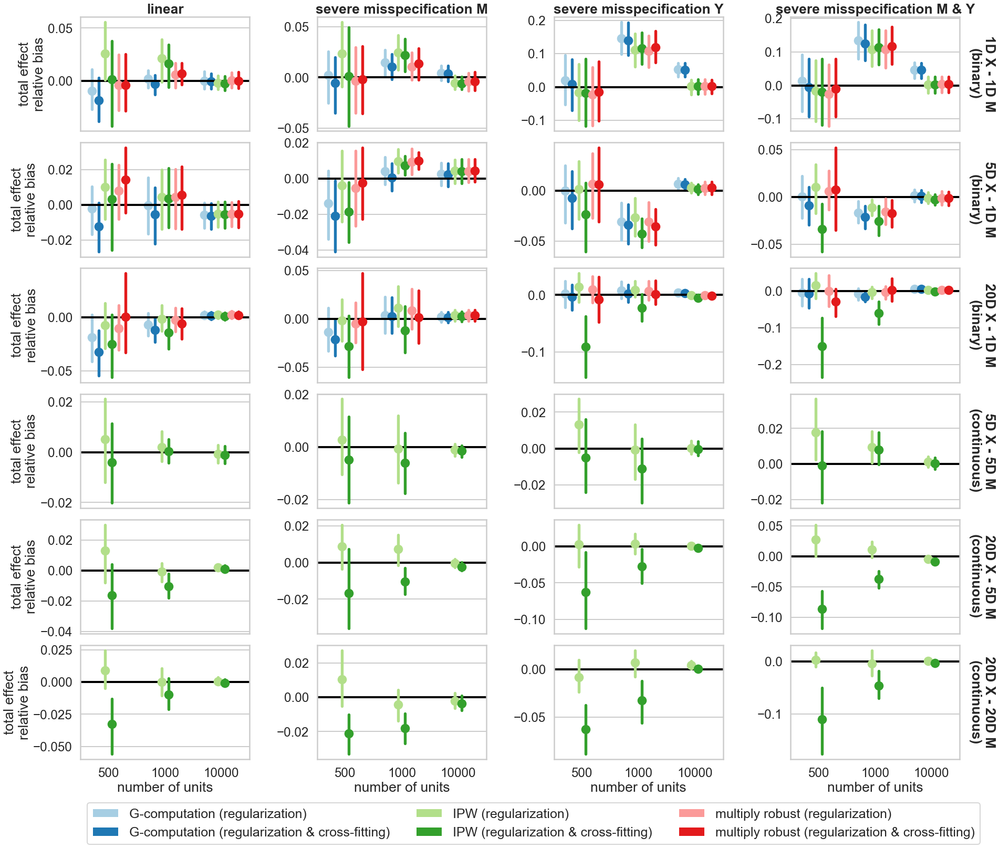

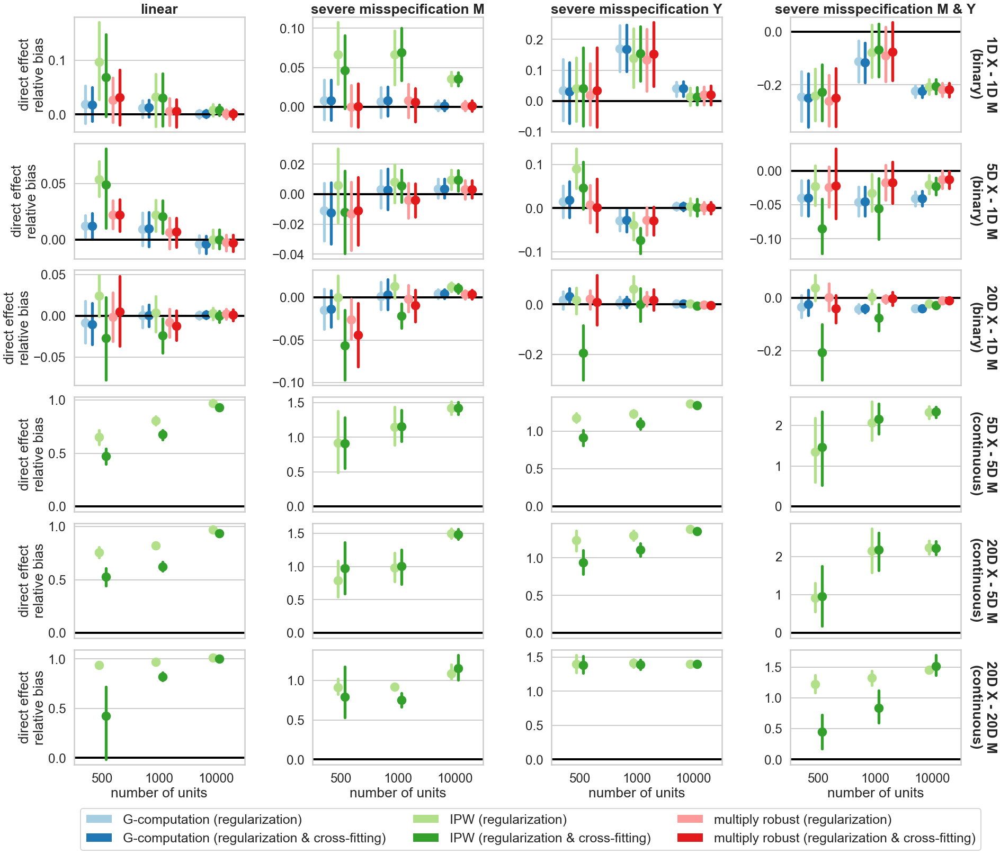

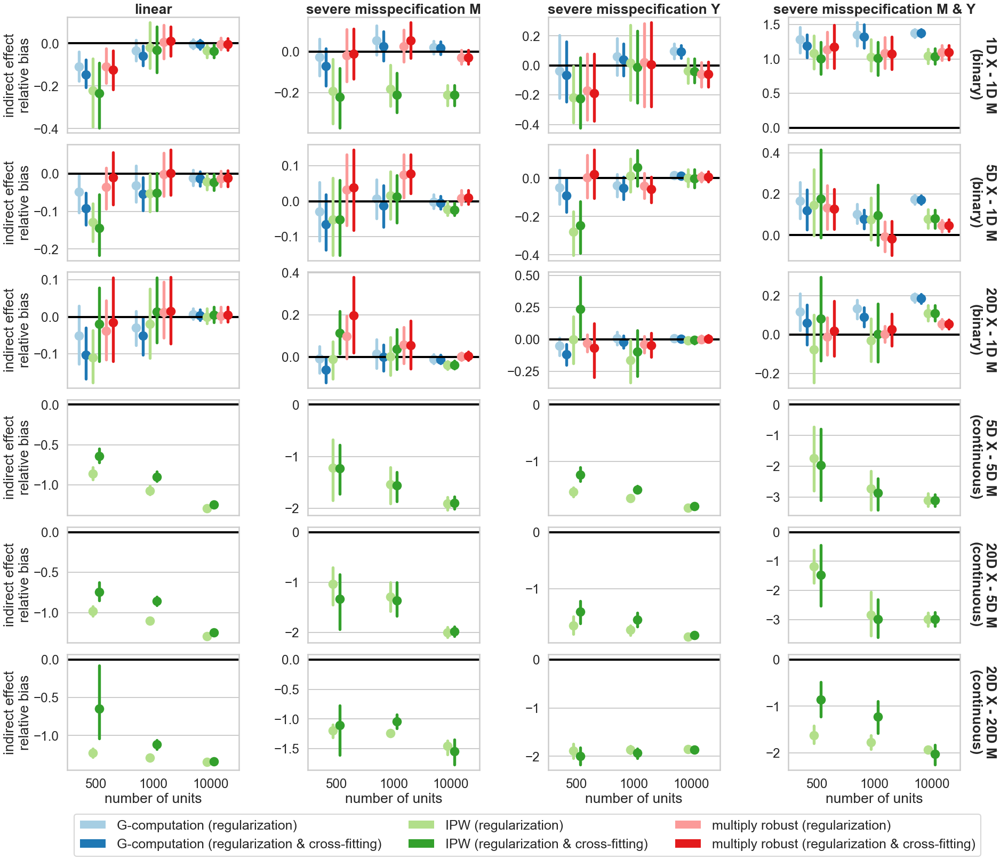

In [15]:
sns.set_context('poster', font_scale=1.1)
for effect in ('total', 'direct', 'indirect'):
    f, axes = plt.subplots(nrows=6, ncols=4, figsize=(30, 26))

    general_estimators = ['g_computation_reg',
                          'g_computation_reg_cf',
                          'huber_ipw_reg',
                          'huber_ipw_reg_cf',
                          'multiply_robust_reg',
                          'multiply_robust_reg_cf']

    restr_df = res_df[(res_df.beta_t_factor==1)&
                      (res_df.estimator.isin(general_estimators))&
                      ((res_df.setting=='linear')|(res_df.setting.str.contains('severe')))]

    color_list = sns.color_palette("Paired").as_hex()
    for ii, configuration in enumerate([0, 1, 2, 3, 4, 5]):
        for jj, setting in enumerate(["linear", "severe misspecification M", "severe misspecification Y", "severe misspecification M & Y"]):
            sub_df = restr_df[(restr_df.configuration==configuration)&(restr_df.nice_setting==setting)]
            ax = axes[ii, jj]
            sns.pointplot(x="n", y="{}_effect_bias".format(effect), hue="estimator",
                          hue_order=general_estimators,
                            data=sub_df,
                           palette="Paired",
                             jitter=True, ax=ax, size=10, join=False, dodge=0.6)
            if (ii==5) and (jj==0):
                legend_items = list()
                for idx, key in enumerate(general_estimators):
                    legend_items.append(Patch(facecolor=color_list[idx], edgecolor='white', label=nice_names_dict[key]))
                ax.legend(handles=legend_items,
                          bbox_to_anchor=(-0, -0.8, 1., .102), fontsize=25, loc=3, ncol=3)
            else:
                ax.get_legend().remove()
            if jj!=0:
                ax.set_ylabel('')
                #ax.yaxis.set_ticklabels([])
            else:
                ax.set_ylabel('{} effect\nrelative bias'.format(effect))
            if ii!=5:
                ax.set_xlabel('')
                ax.xaxis.set_ticklabels([])
            else:
                ax.set_xlabel('number of units')

            if ii==0:
                ax.set_title(setting, fontweight="bold")
            if jj==3:
                ax.text(1.05,0.5,config_dict[configuration].replace(' (', '\n('), fontweight="bold",
                               verticalalignment='center', rotation=270,transform=ax.transAxes, ma='center')


            ax.axhline(y=0, color="black", lw=4)
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.4, hspace=0.1)
    plt.savefig('{}/{}_effect_cross_fitting_impact_reg.pdf'.format(output_path, effect), bbox_inches='tight')

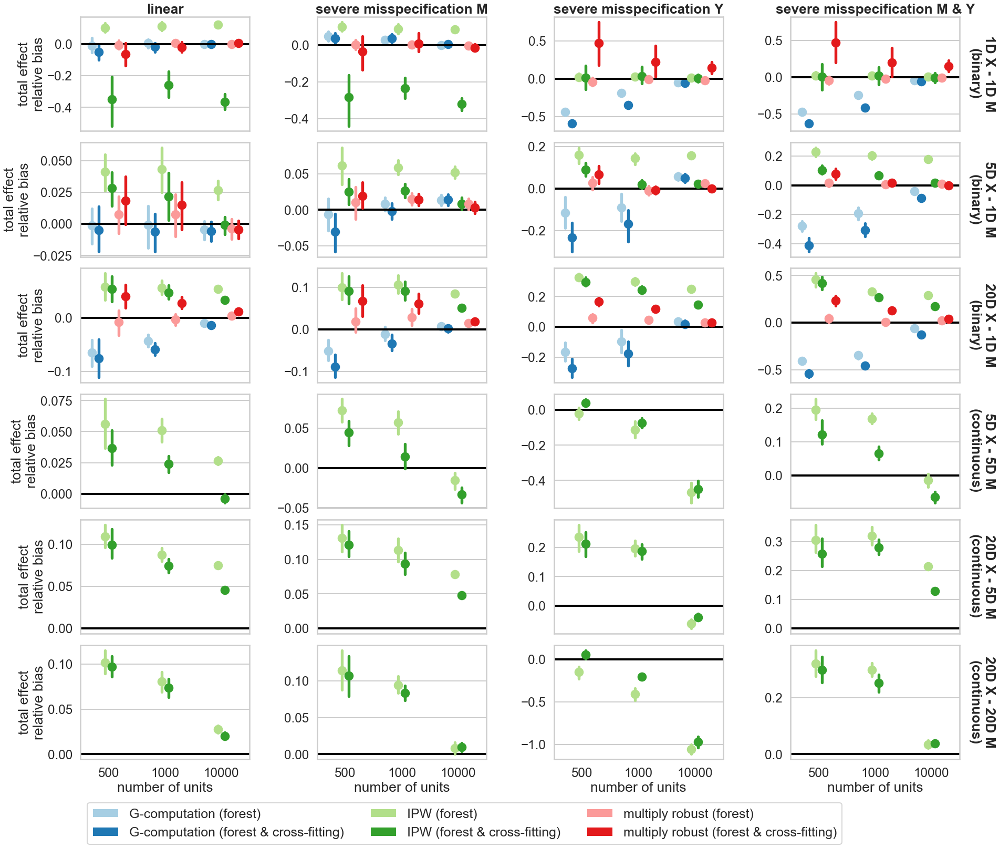

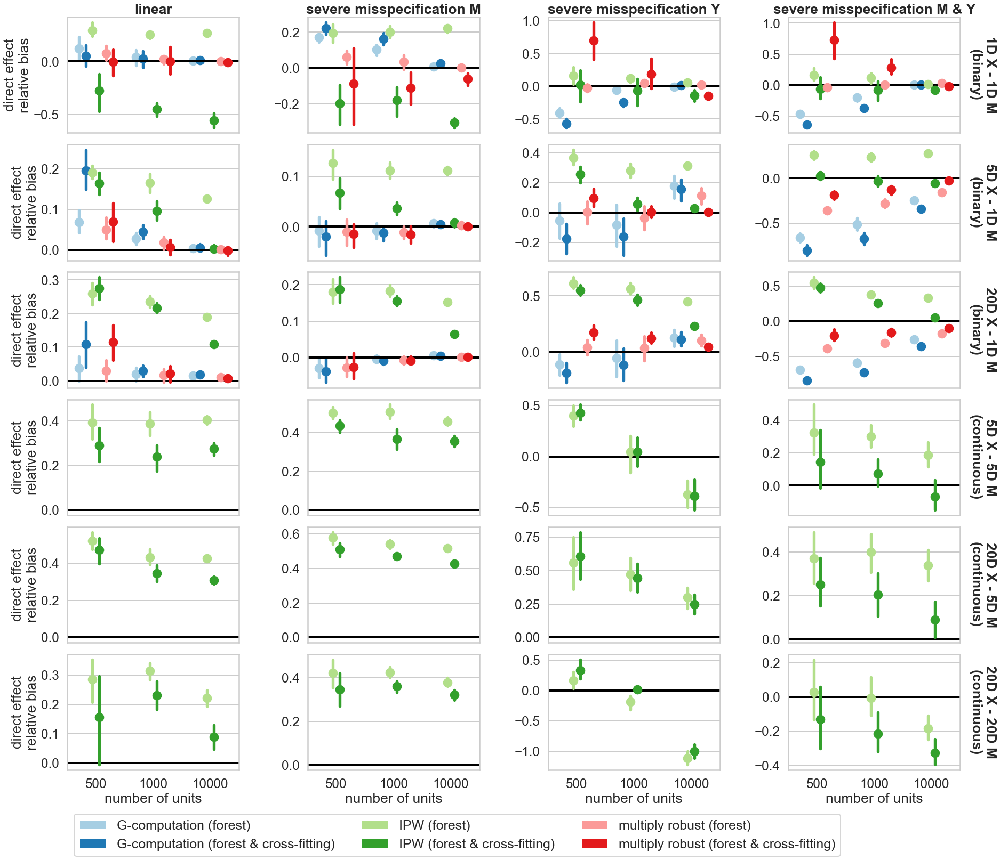

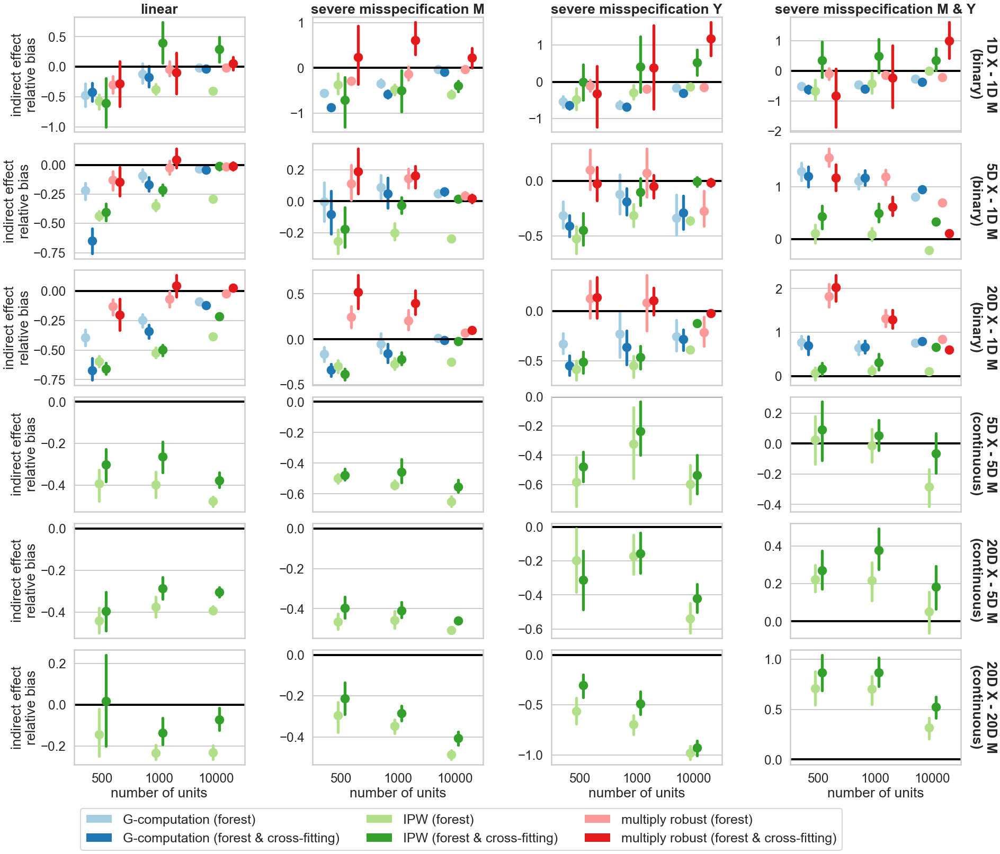

In [16]:
sns.set_context('poster', font_scale=1.1)
for effect in ('total', 'direct', 'indirect'):
    f, axes = plt.subplots(nrows=6, ncols=4, figsize=(30, 26))

    general_estimators = ['g_computation_forest',
                          'g_computation_forest_cf',
                          'huber_ipw_forest',
                          'huber_ipw_forest_cf',
                          'multiply_robust_forest',
                          'multiply_robust_forest_cf']

    restr_df = res_df[(res_df.beta_t_factor==1)&
                      (res_df.estimator.isin(general_estimators))&
                      ((res_df.setting=='linear')|(res_df.setting.str.contains('severe')))]

    color_list = sns.color_palette("Paired").as_hex()
    for ii, configuration in enumerate([0, 1, 2, 3, 4, 5]):
        for jj, setting in enumerate(["linear", "severe misspecification M", "severe misspecification Y", "severe misspecification M & Y"]):
            sub_df = restr_df[(restr_df.configuration==configuration)&(restr_df.nice_setting==setting)]
            ax = axes[ii, jj]
            sns.pointplot(x="n", y="{}_effect_bias".format(effect), hue="estimator",
                          hue_order=general_estimators,
                            data=sub_df,
                           palette="Paired",
                             jitter=True, ax=ax, size=10, join=False, dodge=0.6)
            if (ii==5) and (jj==0):
                legend_items = list()
                for idx, key in enumerate(general_estimators):
                    legend_items.append(Patch(facecolor=color_list[idx], edgecolor='white', label=nice_names_dict[key]))
                ax.legend(handles=legend_items,
                          bbox_to_anchor=(-0, -0.8, 1., .102), fontsize=25, loc=3, ncol=3)
            else:
                ax.get_legend().remove()
            if jj!=0:
                ax.set_ylabel('')
                #ax.yaxis.set_ticklabels([])
            else:
                ax.set_ylabel('{} effect\nrelative bias'.format(effect))
            if ii!=5:
                ax.set_xlabel('')
                ax.xaxis.set_ticklabels([])
            else:
                ax.set_xlabel('number of units')

            if ii==0:
                ax.set_title(setting, fontweight="bold")
            if jj==3:
                ax.text(1.05,0.5,config_dict[configuration].replace(' (', '\n('), fontweight="bold",
                               verticalalignment='center', rotation=270,transform=ax.transAxes, ma='center')


            ax.axhline(y=0, color="black", lw=4)
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.4, hspace=0.1)
    plt.savefig('{}/{}_effect_cross_fitting_impact_forest.pdf'.format(output_path, effect), bbox_inches='tight')

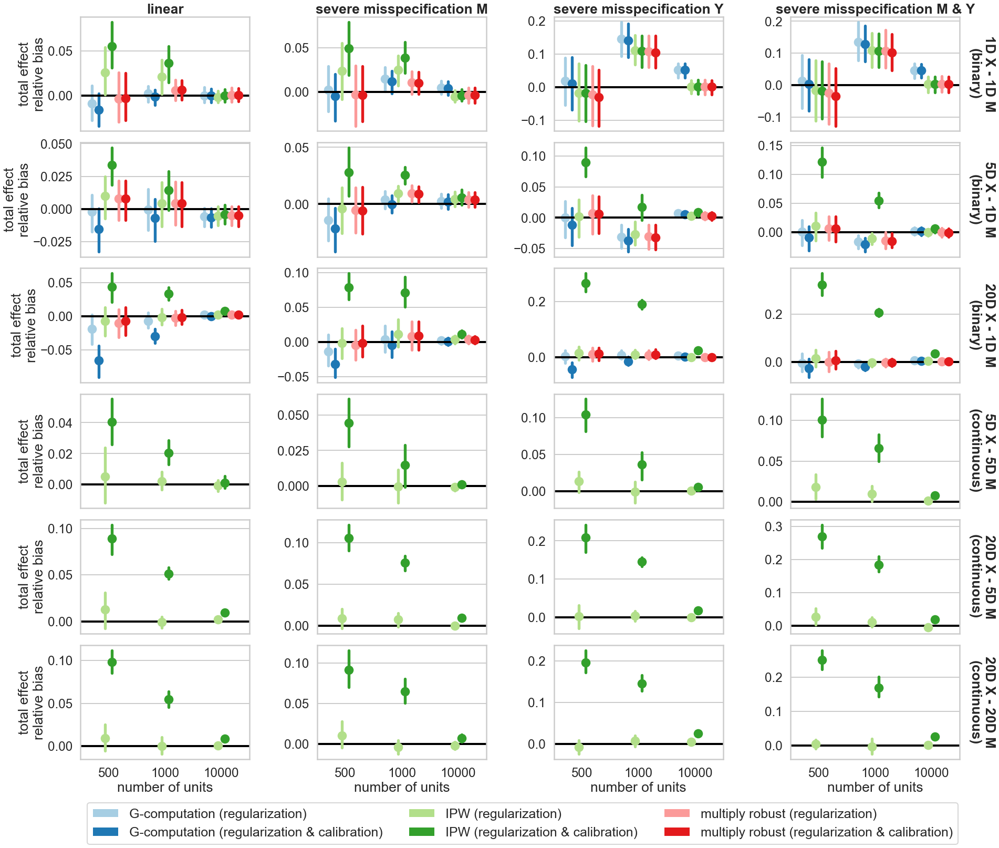

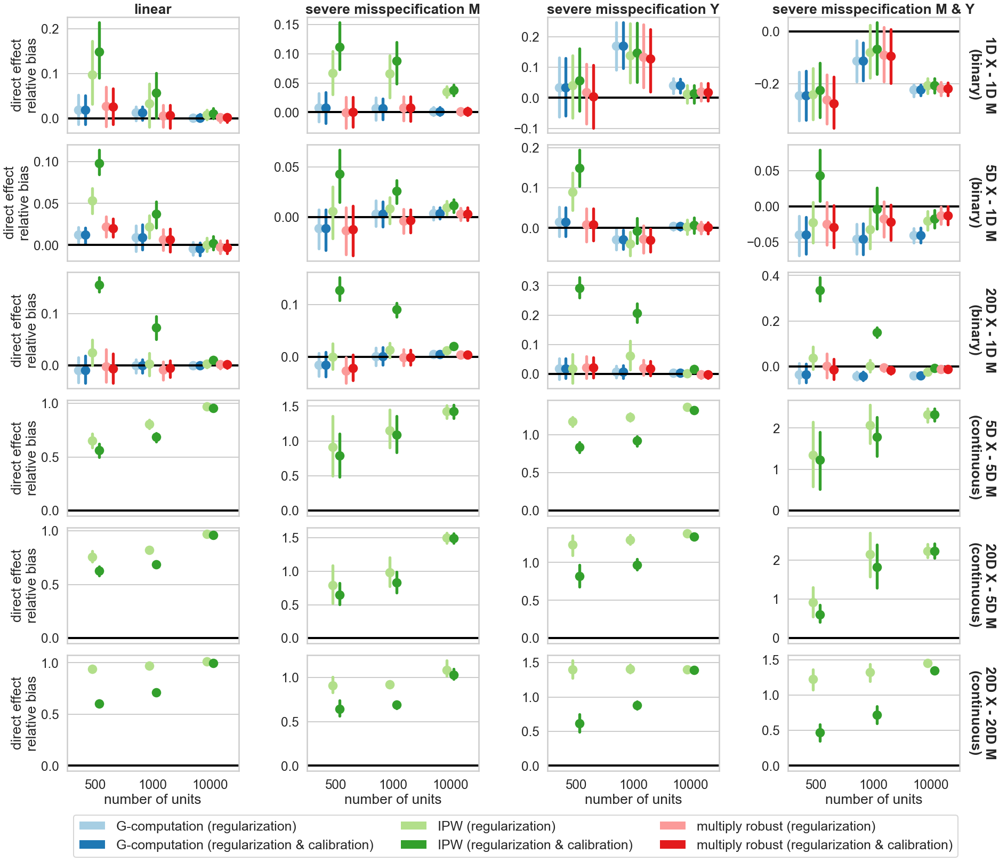

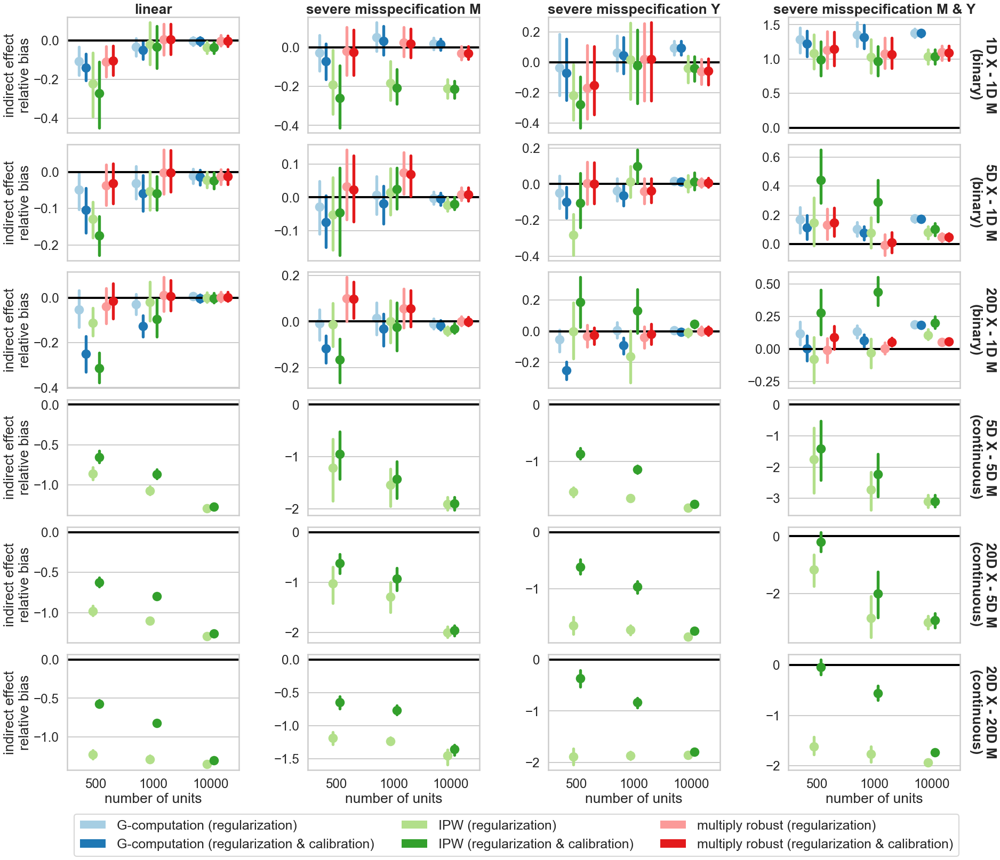

In [17]:
sns.set_context('poster', font_scale=1.1)
for effect in ('total', 'direct', 'indirect'):
    f, axes = plt.subplots(nrows=6, ncols=4, figsize=(30, 26))

    general_estimators = ['g_computation_reg',
                          'g_computation_reg_calibration',
                          'huber_ipw_reg',
                          'huber_ipw_reg_calibration',
                          'multiply_robust_reg',
                          'multiply_robust_reg_calibration']

    restr_df = res_df[(res_df.beta_t_factor==1)&
                      (res_df.estimator.isin(general_estimators))&
                      ((res_df.setting=='linear')|(res_df.setting.str.contains('severe')))]

    color_list = sns.color_palette("Paired").as_hex()
    for ii, configuration in enumerate([0, 1, 2, 3, 4, 5]):
        for jj, setting in enumerate(["linear", "severe misspecification M", "severe misspecification Y", "severe misspecification M & Y"]):
            sub_df = restr_df[(restr_df.configuration==configuration)&(restr_df.nice_setting==setting)]
            ax = axes[ii, jj]
            sns.pointplot(x="n", y="{}_effect_bias".format(effect), hue="estimator",
                          hue_order=general_estimators,
                            data=sub_df,
                           palette="Paired",
                             jitter=True, ax=ax, size=10, join=False, dodge=0.6)
            if (ii==5) and (jj==0):
                legend_items = list()
                for idx, key in enumerate(general_estimators):
                    legend_items.append(Patch(facecolor=color_list[idx], edgecolor='white', label=nice_names_dict[key]))
                ax.legend(handles=legend_items,
                          bbox_to_anchor=(-0, -0.8, 1., .102), fontsize=25, loc=3, ncol=3)
            else:
                ax.get_legend().remove()
            if jj!=0:
                ax.set_ylabel('')
                #ax.yaxis.set_ticklabels([])
            else:
                ax.set_ylabel('{} effect\nrelative bias'.format(effect))
            if ii!=5:
                ax.set_xlabel('')
                ax.xaxis.set_ticklabels([])
            else:
                ax.set_xlabel('number of units')

            if ii==0:
                ax.set_title(setting, fontweight="bold")
            if jj==3:
                ax.text(1.05,0.5,config_dict[configuration].replace(' (', '\n('), fontweight="bold",
                               verticalalignment='center', rotation=270,transform=ax.transAxes, ma='center')


            ax.axhline(y=0, color="black", lw=4)
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.4, hspace=0.1)
    plt.savefig('{}/{}_effect_calibration_impact_reg.pdf'.format(output_path, effect), bbox_inches='tight')

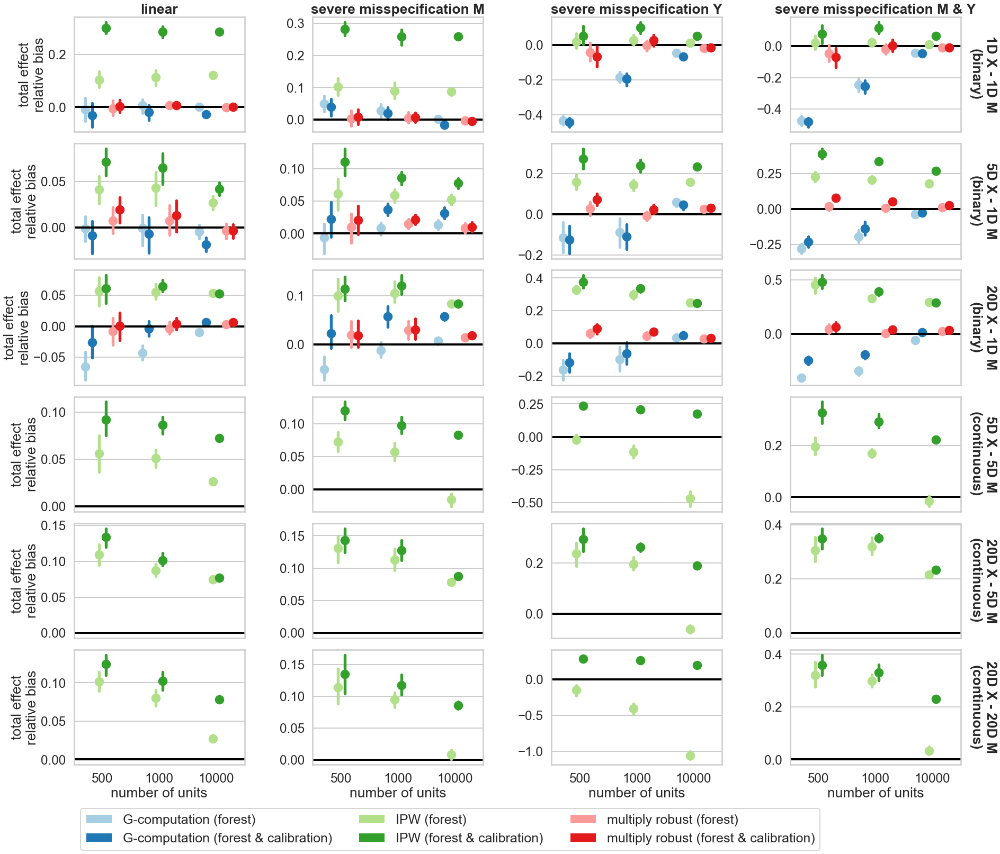

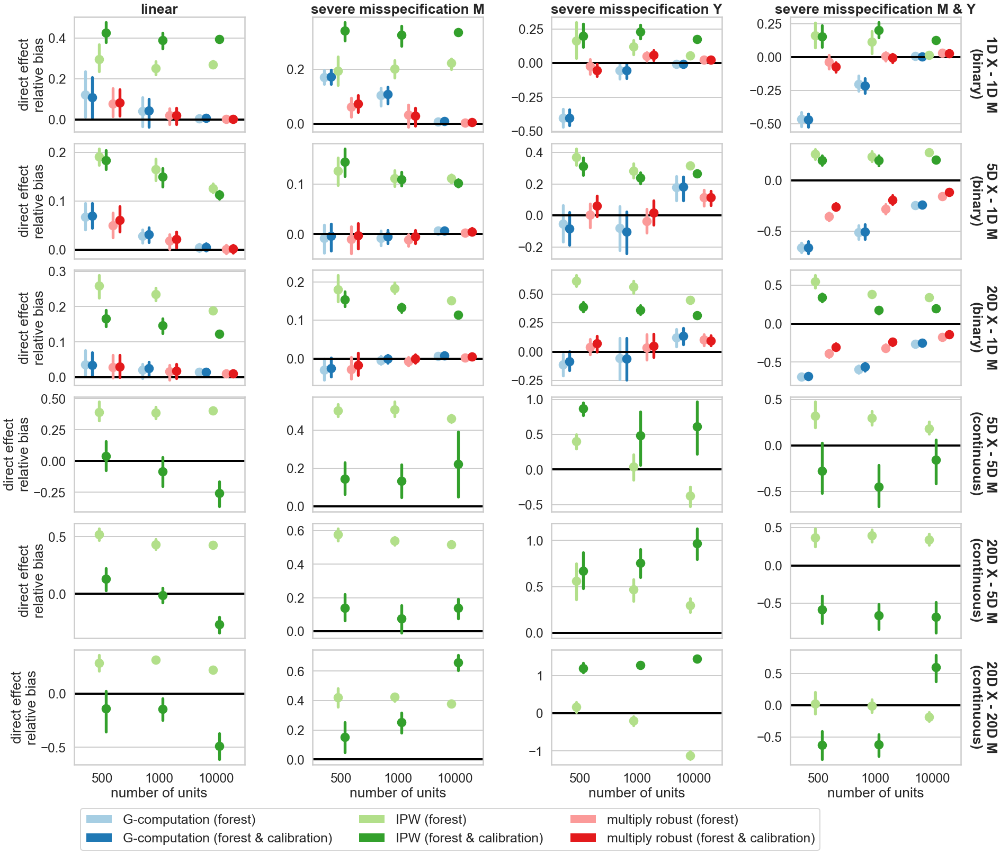

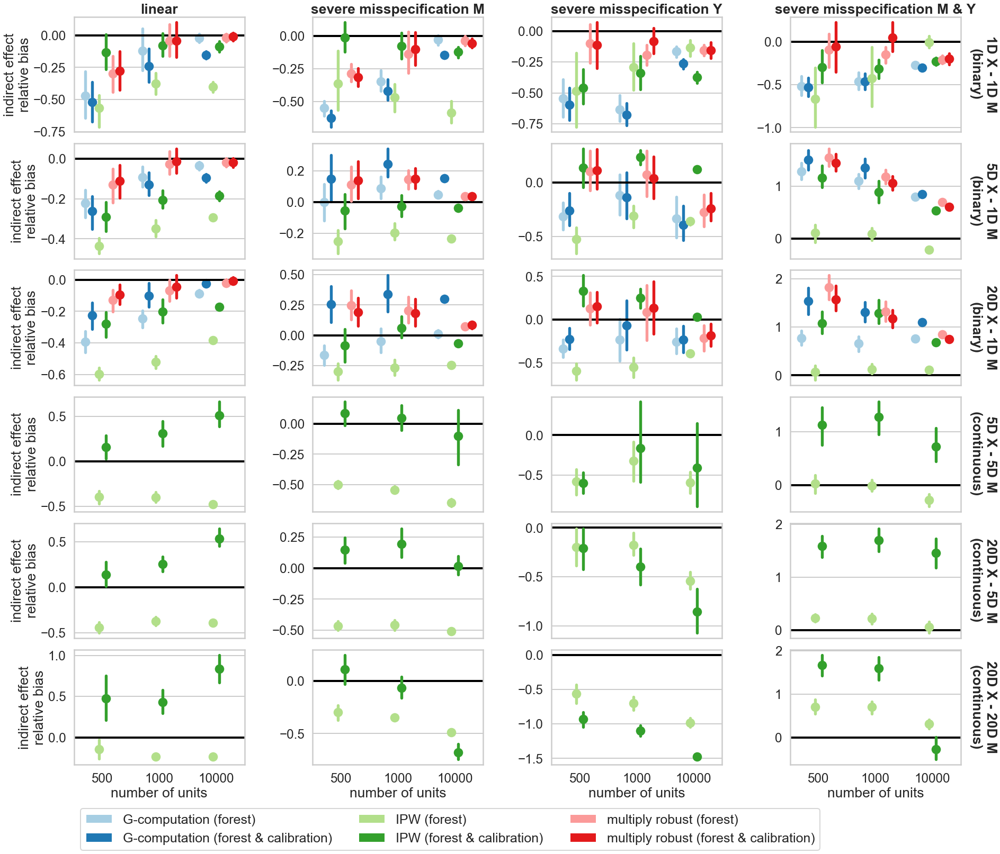

In [18]:
sns.set_context('poster', font_scale=1.1)
for effect in ('total', 'direct', 'indirect'):
    f, axes = plt.subplots(nrows=6, ncols=4, figsize=(30, 26))

    general_estimators = ['g_computation_forest',
                          'g_computation_forest_calibration',
                          'huber_ipw_forest',
                          'huber_ipw_forest_calibration',
                          'multiply_robust_forest',
                          'multiply_robust_forest_calibration']

    restr_df = res_df[(res_df.beta_t_factor==1)&
                      (res_df.estimator.isin(general_estimators))&
                      ((res_df.setting=='linear')|(res_df.setting.str.contains('severe')))]

    color_list = sns.color_palette("Paired").as_hex()
    for ii, configuration in enumerate([0, 1, 2, 3, 4, 5]):
        for jj, setting in enumerate(["linear", "severe misspecification M", "severe misspecification Y", "severe misspecification M & Y"]):
            sub_df = restr_df[(restr_df.configuration==configuration)&(restr_df.nice_setting==setting)]
            ax = axes[ii, jj]
            sns.pointplot(x="n", y="{}_effect_bias".format(effect), hue="estimator",
                          hue_order=general_estimators,
                            data=sub_df,
                           palette="Paired",
                             jitter=True, ax=ax, size=10, join=False, dodge=0.6)
            if (ii==5) and (jj==0):
                legend_items = list()
                for idx, key in enumerate(general_estimators):
                    legend_items.append(Patch(facecolor=color_list[idx], edgecolor='white', label=nice_names_dict[key]))
                ax.legend(handles=legend_items,
                          bbox_to_anchor=(-0, -0.8, 1., .102), fontsize=25, loc=3, ncol=3)
            else:
                ax.get_legend().remove()
            if jj!=0:
                ax.set_ylabel('')
                #ax.yaxis.set_ticklabels([])
            else:
                ax.set_ylabel('{} effect\nrelative bias'.format(effect))
            if ii!=5:
                ax.set_xlabel('')
                ax.xaxis.set_ticklabels([])
            else:
                ax.set_xlabel('number of units')

            if ii==0:
                ax.set_title(setting, fontweight="bold")
            if jj==3:
                ax.text(1.05,0.5,config_dict[configuration].replace(' (', '\n('), fontweight="bold",
                               verticalalignment='center', rotation=270,transform=ax.transAxes, ma='center')


            ax.axhline(y=0, color="black", lw=4)
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.4, hspace=0.1)
    plt.savefig('{}/{}_effect_calibration_impact_forest.pdf'.format(output_path, effect), bbox_inches='tight')